# Exploratory Data Analysis and Network Analysis

In [5]:
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import Counter
from joblib import load, dump
from ipywidgets import widgets
import plotly.graph_objects as go
import plotly.express as px
from dash import html, dcc
from dash.dependencies import Input, Output
import matplotlib.gridspec as gridspec
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.stats import entropy
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from wordcloud import WordCloud
import community as community_louvain
from adjustText import adjust_text
import seaborn as sns
import pandas as pd
import numpy as np
import random
import networkx as nx
import pyLDAvis
import dash
import string
import time
import os
import re

The dataframes imported from the previous notebook consist of a document topic distribution with each document being one 5000-word segment of a book and features about the texts covering the following attributes: 'title', 'author', 'date','gender', 'birthdate', 'nationality', 'source' always being given, as well as the following only filled for about 1/4 of the texts 'period', 'mode', 'genre', 'role' and 'polarity', 

Additionally a number of features relevant for th topic explorations offered by pyLDAvis are imported as well.

In [28]:
df_txt_features_LDA=pd.read_csv('./analysis/df_txt_features_LDA.csv')
df_txt_features_CTM=pd.read_csv('./analysis/df_txt_features_CTM.csv')
df_txt_features_ETM=pd.read_csv('./analysis/df_txt_features_ETM.csv')

In [8]:
top_words_per_topic_LDA = ('./analysis/top_words_per_topic_LDA.joblib')
top_words_per_topic_CTM = ('./analysis/top_words_per_topic_CTM.joblib')
top_words_per_topic_ETM = ('./analysis/top_words_per_topic_ETM.joblib')

In [10]:
topic_term_dists_LDA = load('./analysis/topic_term_dists_LDA.joblib')
doc_topic_dists_LDA = load('./analysis/doc_topic_dists_LDA.joblib')
topic_term_dists_CTM = load('./analysis/topic_term_dists_CTM.joblib')
doc_topic_dists_CTM = load('./analysis/doc_topic_dists_CTM.joblib')
topic_term_dists_ETM = load('./analysis/topic_term_dists_ETM.joblib')
doc_topic_dists_ETM = load('./analysis/doc_topic_dists_ETM.joblib')
vocab = load('./analysis/vocab.joblib')
doc_lengths= load('./analysis/doc_lengths.joblib')
term_frequency = load('./analysis/term_frequency.joblib')

## LDA

pyLDAvis offers an intuitive method for exploring the most important words for ach topic, the weight they carry within it and the relationship and distance between the given topics. For this multidimensional scaling reduces the topic term distribution to a two dimensional space, retaining both the importance of a given topic within the corpus, as well as their distance to one another with the help of Jensen-Shannon Divergence as its metric. A common approach for multi dimesnional scaling.

In [47]:
prepared_data = pyLDAvis.prepare(topic_term_dists_LDA, doc_topic_dists_LDA, doc_lengths, vocab, term_frequency)

pyLDAvis.display(prepared_data)

Topic Interpretation:
Analyzing the intersection of the most salient and relevant terms for each topic, aiming to synthesize the underlying themes into coherent labels. Ennui, ants, firmness, confessor, vegetables, illusion, calculation, morbid, blasted, coolies, bayonets and terms of logical reasoning are strewn through out many topics.

In [140]:
topic_labels = {
    "Topic 1": "Ominous Atmosphere - \n Spacial and Auditory Imagery: \n vastness, archaic, Refinement, Gloom, demons.",
    "Topic 2": "Emotional Dialogue -  \n Fear, Secrecy, Flattery,Arousal and Strife \n - Religion and Devils.",
    "Topic 3": "Status and Individuality - \n Striving, Misery and Plentifullness - Excess.",
    "Topic 4": "Myths, Trials and Death - \n Persecution of Crime, Telling Tales, magic and ants.",
    "Topic 5": "Excitablity, Madness and Deceit - \n Aggression, conflict and glee.",
    "Topic 6": "Nature and Reasoning - \n Creativity and Understanding, mixed with Nature.",
    "Topic 7": "Social Pleasantries - \n Diplomacy, Plotting to Gossip.",
    "Topic 8": "Faith, Convictions, Chivalry and Death - \n Erudition, Religion and Knights. Ants.",
    "Topic 9": "Fortitude, Conviction and Adventure - \n Danger and social Station.",
    "Topic 10": "Ferrocity and Tragedy - \n animalistic traits, intimacy, conflict and science.",
    "Topic 11": "Ravens and Gloom - Longing, Death and Artifice.",
    "Topic 12": "Home Invasion - Domestic Mystery and Conflict.",
    "Topic 13": "Rituals and Festivities - \n Dance, Witchcraft and Coronations.",
    "Topic 14": "Conflict, Animosity and Change - \n Emotional Changes, Death and Construction.",
    "Topic 15": "Trickery and Science - \n Deceit, Reasoning and Institutions.",
    "Topic 16": "Desecrated Chapel - \n Confessions and Defilement - Devils and Maniacs.",
    "Topic 17": "(Un-)death, spectral bodies and judgement - \n human physicality, grief, emotions.",
    "Topic 18": "Mystery and Adversity - \n Dream and fugue states, Investigation.",
    "Topic 19": "Forlorn Carnival - Dances, Disgust and Intimacy.",
    "Topic 20": "Science, Reasoning and Objects - \n Technology, Professions and Nature.",
    "Topic 21": "War, Punishment and Exploration.",
    "Topic 22": "Emotional Dynamics and Interactions.",
    "Topic 23": "War, dreams and demons.",
    "Topic 24": "Human Interactions and Emotional States.",
    "Topic 25": "Flattery, clothing, Interactions.",
    "Topic 26": "Witchcraft, Rituals and Fear of it - \n Banishment, Threats and Armor.",
    "Topic 27": "Dragon Attack and Defense - \n Troops, Mountains and Cynicism.",
    "Topic 28": "Communion in Nature - \n Transformation, Relationships and Identity.",
    "Topic 29": "Bickering, Fighting and Mountains.",
    "Topic 30": "Bureaucracy, Bargaining and Dissatisfaction.",
    "Topic 31": "Exploration, Gloom, Caverns.",
    "Topic 32": "Tranquility and Bustle - \n Terms of Relaxation, Calm and Action.",
    "Topic 33": "Treacherous Company - on the run and scarred.",
    "Topic 34": "Secrets and Suspense - \n Mystery, Devils and Assasinations.",
    "Topic 35": "Mental Illness, Law and Outcasts - \n Fear, Suspicion and Struggles.",
    "Topic 36": "Individualism vs. Conformity - \n Rebellion and Social Norms.",
    "Topic 37": "Order and Chaos - \n Constrained Focus and Unchecked Emotions.",
    "Topic 38": "Psychology, Trauma and Secrets.",
    "Topic 39": "Quest for Meaning - Self-Discovery, Transformation.",
    "Topic 40": "Ambition and Struggle - Emotional Turmoil.",
    "Topic 41": "Despair, Isolation and Oppression.",
    "Topic 42": "Illusion, Enchantment and Betrayal.",
    "Topic 43": "Woodlands, Mystery, Illusion, Beasts.",
    "Topic 44": "Companionship in Times of Trial and Distress.",
    "Topic 45": "Intimacy, Emotions and Identity.",
    "Topic 46": "Frustration, Society, Retreat into Nature - \n Society, Reason, Tension, negative Feelings, Forrests.",
    "Topic 47": "Human Nature and the Connection to the Land, \n Myth and (Human) Nature - Solace, Inspiration, Acceptance for Hardships.",
    "Topic 48": "Enthralling Garden full of Voices - \n Echantment and Vocalization, Nature.",
    "Topic 49": "Departure and Music.",
    "Topic 50": "Myth, Nature, Wonder and Despair.",
    "Topic 51": "Dissilusionment with Society - \n Resistance, Protest, Retreat.",
    "Topic 52": "Adventure, Spendor, Power and Challenges, History.",
    "Topic 53": "Mercantile and Creativity - Haggling and Emotions.",
    "Topic 54": "Medieval Cities, Castles and Courtship.",
    "Topic 55": "Crocodiles, Massacres and Traveling.",
    "Topic 56": "Exlporation of an Island and Obsession.",
    "Topic 57": "Carnage near a Castle.",
    "Topic 58": "Weddings and Rituals - Clamoring Throng.",
    "Topic 59": "Judgment and Scrutiny - Tense Diplomacy.",
    "Topic 60": "Confession and marriage before  \n Conscription and Battle.",
    "Topic 61": "Vapires, Ragality, Experiments, \n Festivities and Sacrifice.",
    "Topic 62": "Dragons, Subterraneous Lairs, Riddles and Lore.",
    "Topic 63": "Hidden Dangers, Fear, Anticipation, Supernatural.",
    "Topic 64": "Artistic Ambition and Trials - Mastery and the Devil.",
    "Topic 65": "Atmospheric Battle Descriptions and Royalty.",
    "Topic 66": "Hidden Knowledge, Learning and Secrets.",
    "Topic 67": "Monsters, Art, Romance - Myth and Gloom.",
    "Topic 68": "Secluded Initiation Rites.",
    "Topic 69": "Seduction, Deception, Violence, Bureaucracy.",
    "Topic 70": "Myth and splendor - Wealth and Castles.",
    "Topic 71": "Haunted Castles and their Prohecies.",
    "Topic 72": "Festivities, Noise, Crowds.",
    "Topic 73": "Camps, Trenches and Weather."
}


### Visualizing the qualities of topics

We recreate the term relevance measure used in pyLDAvis and create some wordclouds for ease of comparison

In [12]:
def calculate_term_relevance(topic_term_dists, term_frequency, lambda_step=0.6):
    """
    Calculate term relevance for each topic.
    Relevance is defined as in pyLDAvis: lambda * log(prob of term given topic) + 
    (1 - lambda) * log(prob of term given topic / prob of term in corpus)
    """
    # Convert term frequency to probability
    term_prob = term_frequency / term_frequency.sum()

    # Log probability of term given topic
    log_prob_w_given_t = np.log(topic_term_dists + 1e-12) # Adding a small constant to avoid log(0)

    # Log lift
    log_lift = np.log(topic_term_dists / term_prob + 1e-12) # Adding a small constant to avoid division by zero

    # Term relevance
    term_relevance = lambda_step * log_prob_w_given_t + (1 - lambda_step) * log_lift

    return term_relevance

In [50]:
def calculate_saliency(topic_term_dists, term_frequency):
    """
    Calculate the saliency of terms according to the logic of pyLDAvis.
    Saliency(term w) = frequency(w) * [sum_t p(t | w) * log(p(t | w)/p(t))]
    """
    # Convert term frequency to probability
    term_prob = term_frequency / term_frequency.sum()

    # p(t | w)
    p_t_given_w = topic_term_dists / topic_term_dists.sum(axis=1)[:, None]

    # p(t)
    p_t = topic_term_dists.sum(axis=0) / topic_term_dists.sum().sum()

    # Calculating saliency
    saliency = term_prob * np.sum(p_t_given_w * np.log(p_t_given_w / p_t), axis=0)

    return saliency

In [ ]:
def generate_word_clouds(term_relevance, saliency, topic_term_dists_LDA, vocab, n_topics):
    wc_width, wc_height = 200, 200  #  wc size in pixels

    # Create subplot grid
    fig, axs = plt.subplots(nrows=19, ncols=8, figsize=(36, 85))  # 8 rows, 8 columns
    axs = axs.flatten()

    for i in range(n_topics):
        # Generate salient word cloud
        topic_saliency = saliency * topic_term_dists_LDA[i, :]
        top_salient_terms = topic_saliency.argsort()[-30:][::-1]
        salient_word_freq = {vocab[term]: topic_saliency[term] for term in top_salient_terms}
        salient_wc = WordCloud(width=wc_width, height=wc_height, background_color='white', colormap='Greens').generate_from_frequencies(salient_word_freq)
        axs[i*2].imshow(salient_wc, interpolation='bilinear')
        axs[i*2].axis('off')
        axs[i*2].set_title(f'Topic {i+1} - Salient', fontsize=23)

        # Generate relevant word cloud
        topic_relevance = term_relevance[i, :]
        top_relevant_terms = topic_relevance.argsort()[-30:][::-1]
        relevant_word_freq = {vocab[term]: topic_relevance[term] for term in top_relevant_terms}
        relevant_wc = WordCloud(width=wc_width, height=wc_height, background_color='white', colormap='Reds').generate_from_frequencies(relevant_word_freq)
        axs[i*2+1].imshow(relevant_wc, interpolation='bilinear')
        axs[i*2+1].axis('off')
        axs[i*2+1].set_title(f'Topic {i+1} - Relevant', fontsize=23)

    # Hide the remaining axes
    for i in range(n_topics*2, len(axs)):
        axs[i].set_visible(False)

    # Adjust layout and spacing
    plt.subplots_adjust(wspace=0.5, hspace=0.5)
    plt.tight_layout()
    plt.show()

term_relevance = calculate_term_relevance(topic_term_dists_LDA, np.array(term_frequency))
saliency = calculate_saliency(topic_term_dists_LDA, np.array(term_frequency))

generate_word_clouds(term_relevance, saliency, topic_term_dists_LDA, vocab, topic_term_dists_LDA.shape[0])

In order to decrease the overall filesize, the following visualization is provided as an image outside of the notebook itself, please refer to topic_wordclouds.png

#### Exploring the feature distribution of the corpus in general

In [13]:
df_feat = df_txt_features_LDA.copy()
df_feat.fillna({'period': 'Unknown', 'mode': 'Unknown', 'genre': 'Unknown', 'role': 'Unknown'}, inplace=True)

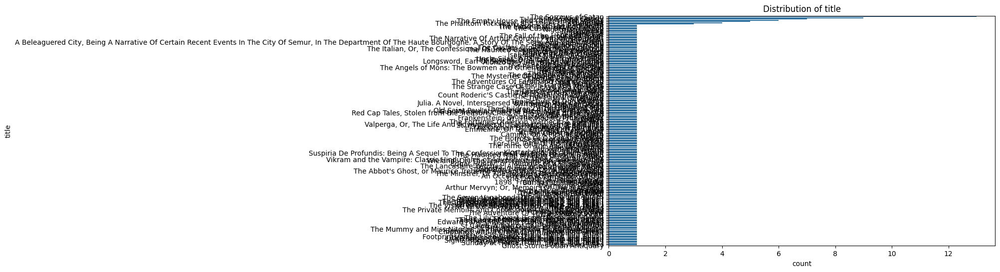

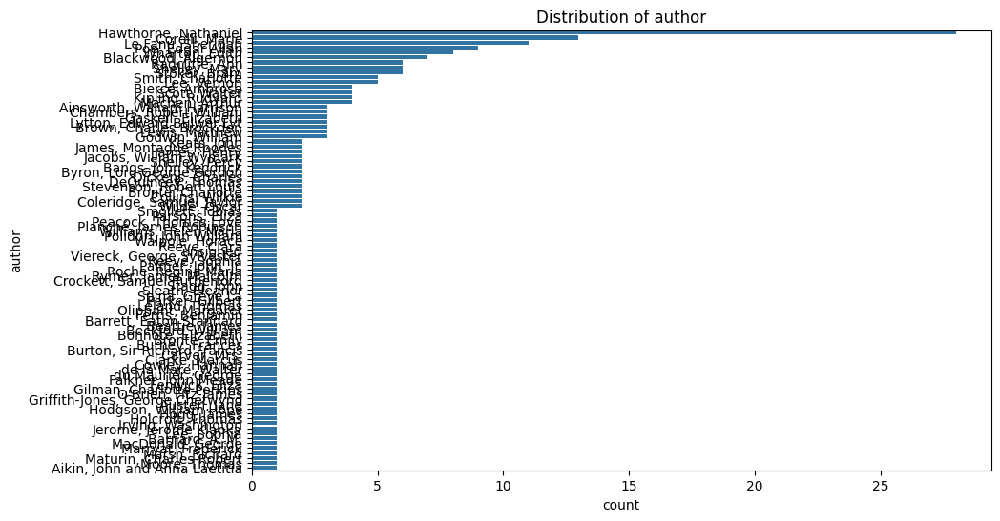

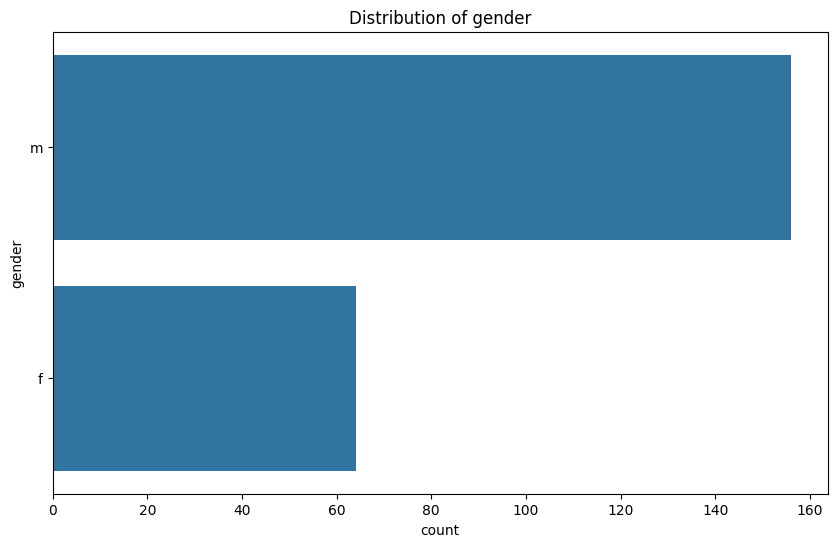

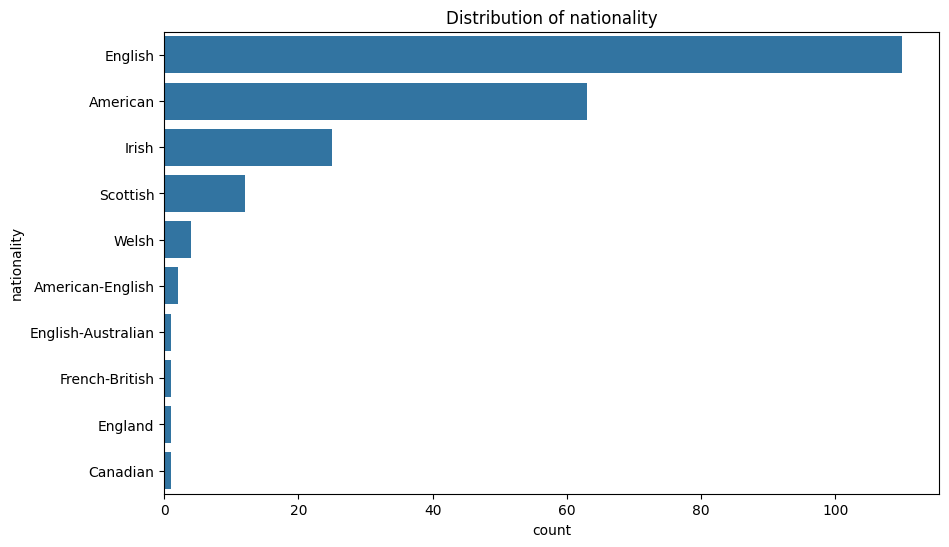

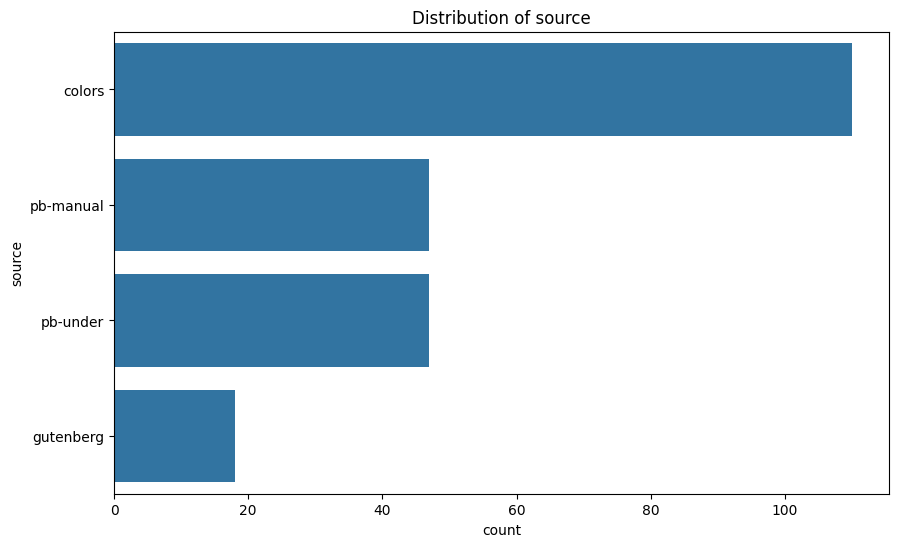

...

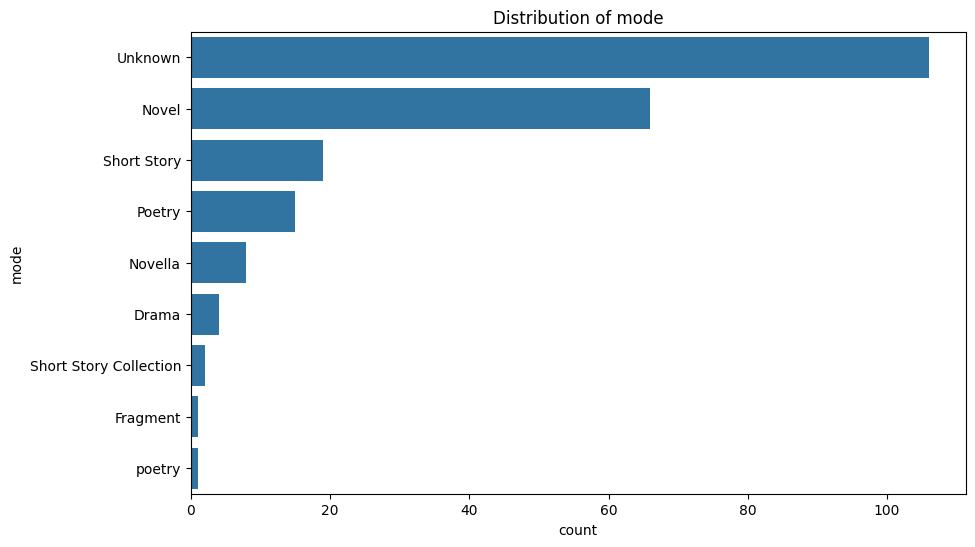

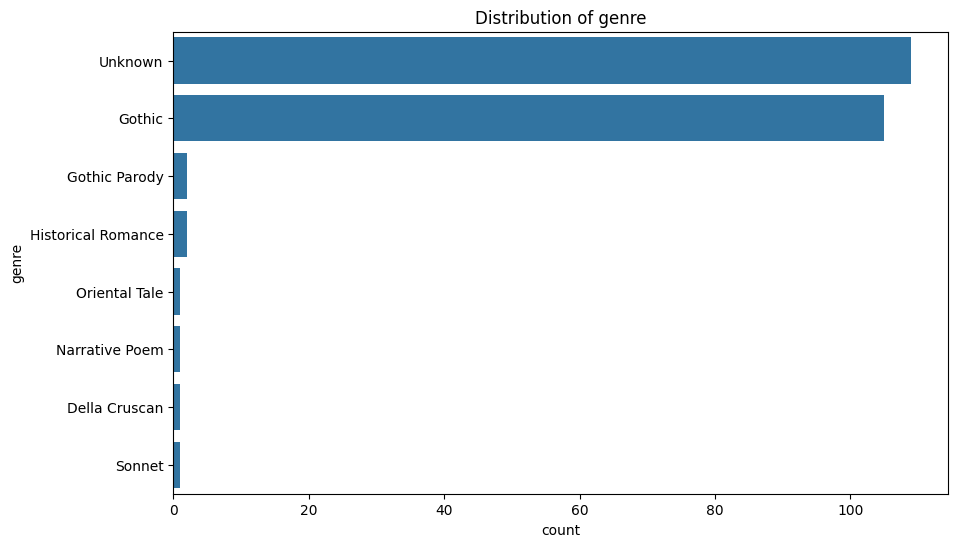

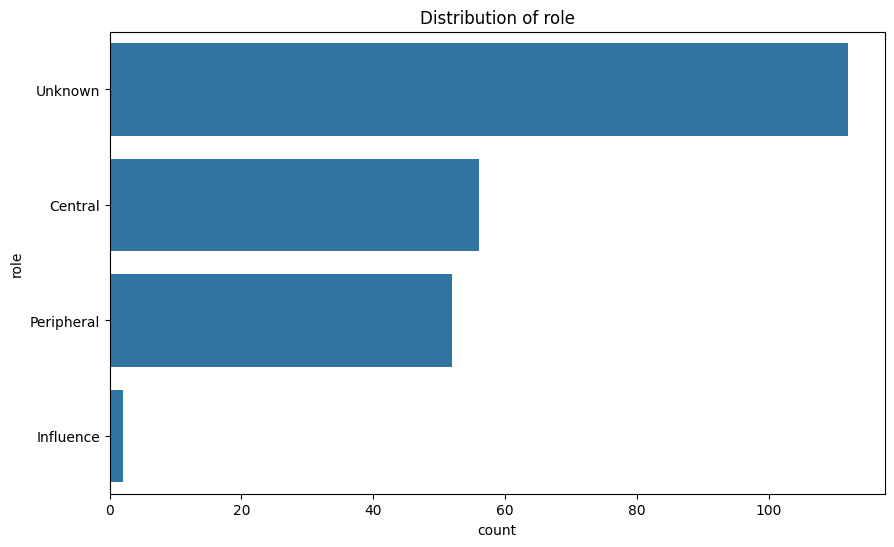

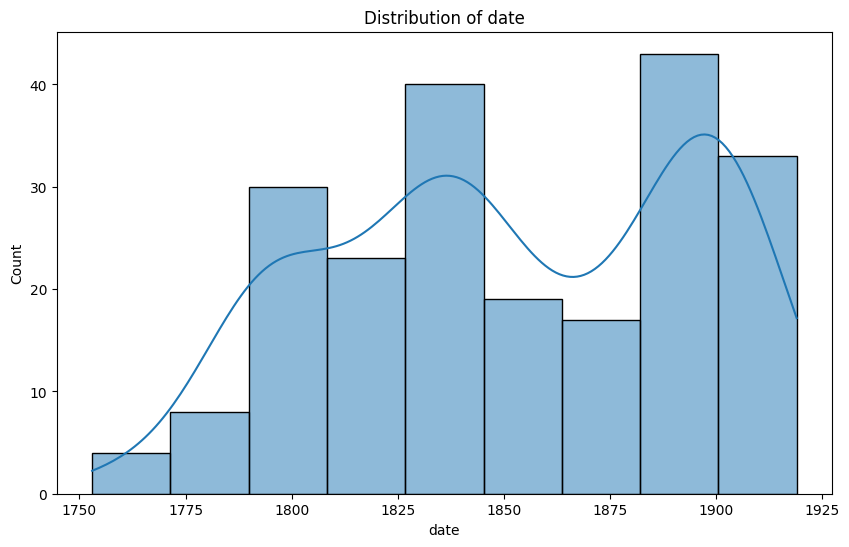

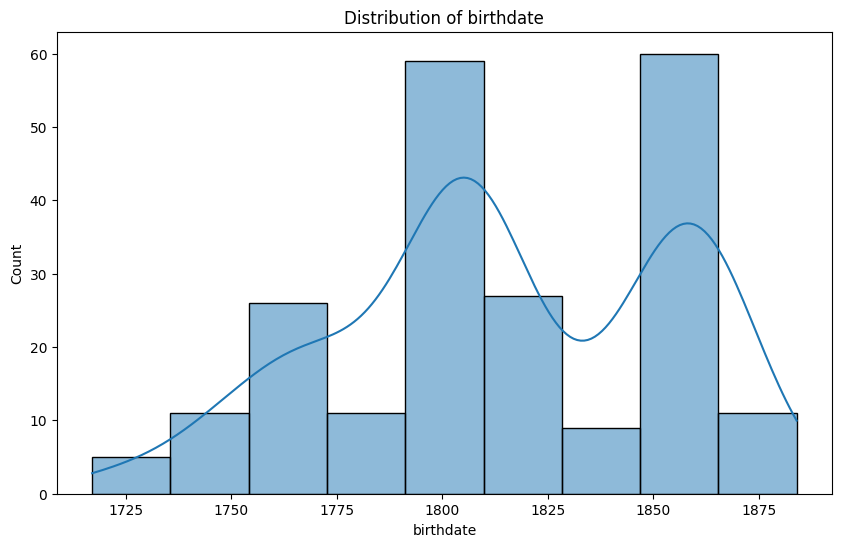

In [53]:
# Categorical features
categorical_features = ['title', 'author', 'gender', 'nationality', 'source', 'period', 'mode', 'genre', 'role']
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    # Ordering the categories by frequency
    order = df_feat[feature].value_counts().index
    sns.countplot(y=feature, data=df_feat, order=order)
    plt.title(f'Distribution of {feature}')
    plt.show()

# Numerical features
numerical_features = ['date', 'birthdate']
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    sns.histplot(df_feat[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.show()

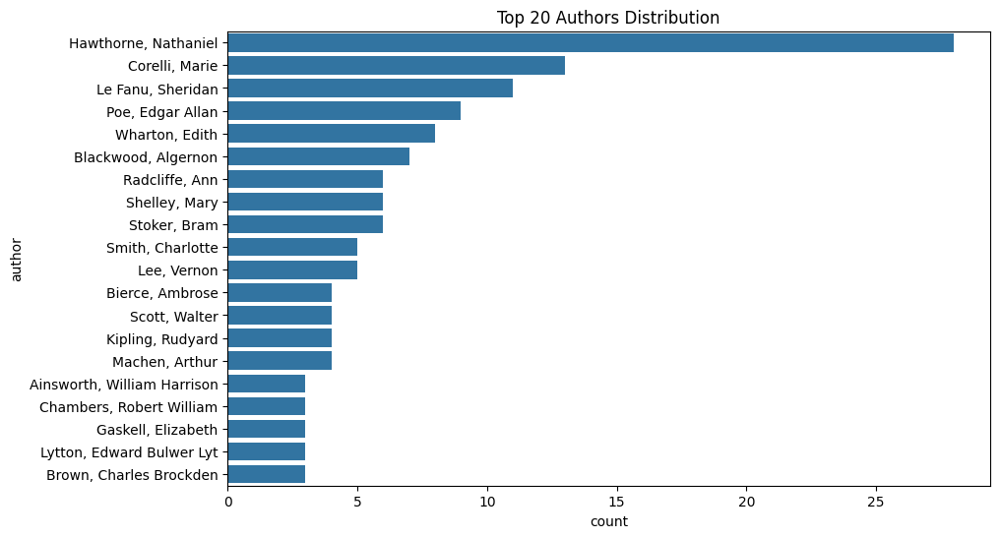

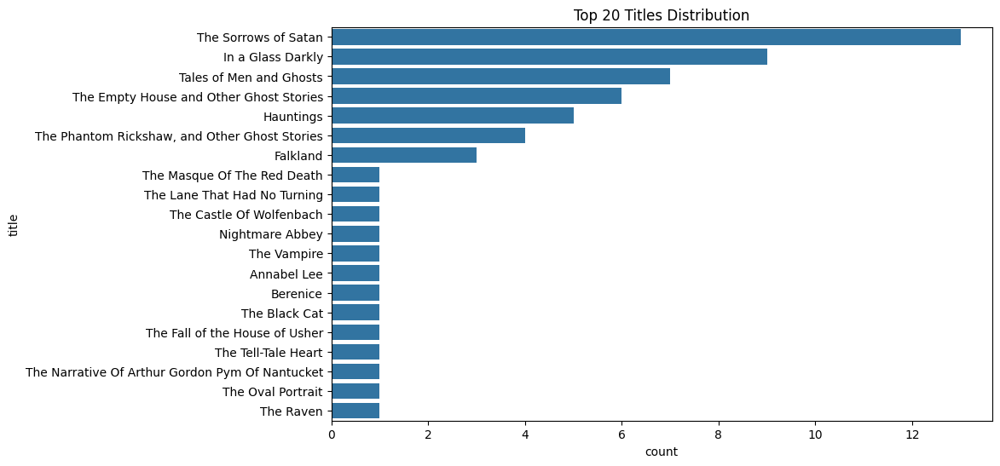

In [54]:
# Adjusting distributions for 'name' and 'title' - focusing on the upper end and bending part of the distribution

top_authors = df_feat['author'].value_counts().nlargest(20).index
top_titles = df_feat['title'].value_counts().nlargest(20).index

# Plotting distributions for 'author'
plt.figure(figsize=(10, 6))
author_order = df_feat['author'].value_counts().iloc[:20].index
sns.countplot(y='author', data=df_feat, order=author_order)
plt.title('Top 20 Authors Distribution')
plt.show()

# Plotting distributions for 'title'
plt.figure(figsize=(10, 6))
title_order = df_feat['title'].value_counts().iloc[:20].index
sns.countplot(y='title', data=df_feat, order=title_order)
plt.title('Top 20 Titles Distribution')
plt.show()

#### Topic trends over time

In [15]:
df_time = df_txt_features_LDA.copy()

In [16]:
topic_columns = [col for col in df_time.columns if col.startswith('Topic')]

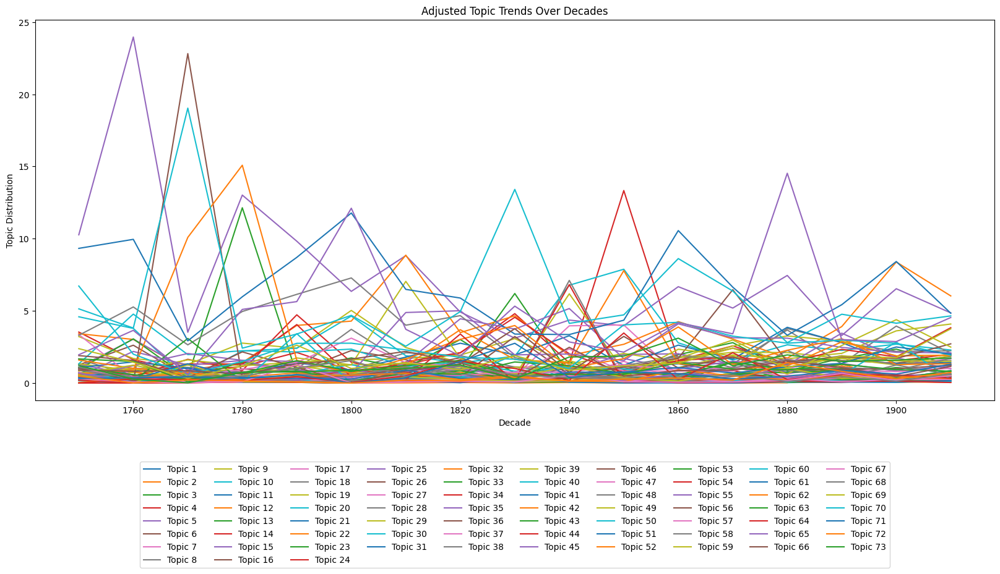

In [17]:
# Function to convert year to decade
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

Those topics that surpass a certain threshhold of importance through out their life cycle.
- Filtering for maximal weight through out their lifetime.

In [18]:
# Group 1: Topics that never rise beyond a consistent level
consistent_topics = [topic for topic in topic_columns if decade_grouped[topic].max() <= 8]

# Group 2: Topics that fluctuate
peaking_topics = [topic for topic in topic_columns if decade_grouped[topic].max() > 8]

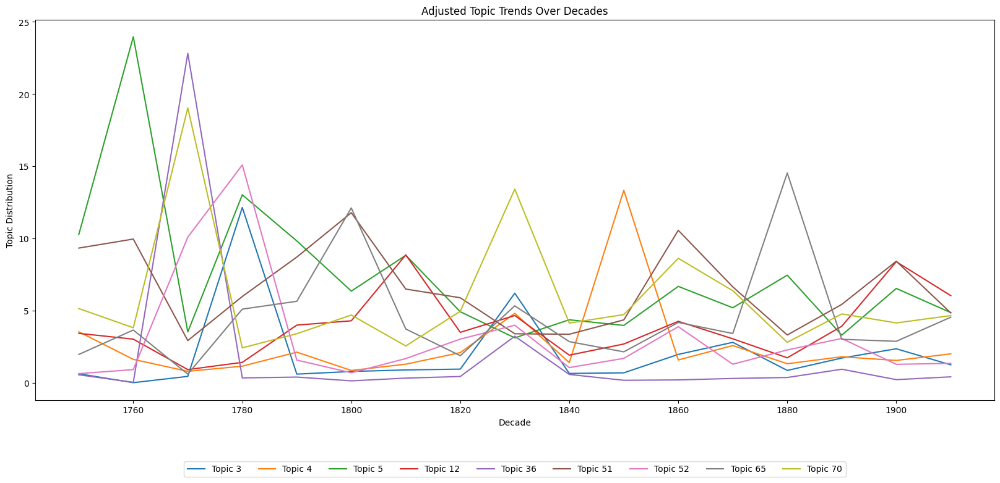

In [19]:
plt.figure(figsize=(20, 8)) 
for topic in peaking_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

Those topics that surpass a certain threshhold of fluctuation and carry a standard deviation higher than the 75th percentile across all topics, indicating that they do not maintain consistent values and vary significantly over the decades.

In [20]:
# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped.std()

# Setting a threshold for identifying strong fluctuations
percentile_threshold = np.percentile(topic_fluctuations, 90)

# Topics with fluctuations above the threshold
fluctuating_topics = topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

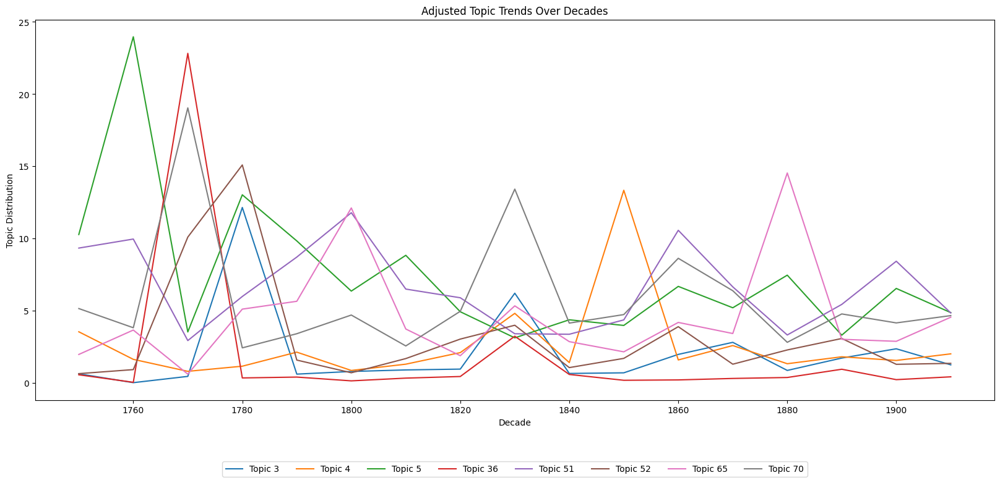

In [21]:
plt.figure(figsize=(20, 8)) 
for topic in fluctuating_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [36]:
df_LDA = df_txt_features_LDA.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_LDA['decade'] = df_LDA['date'].astype(int).apply(year_to_decade)

# Extracting topic columns
topic_columns_LDA = [col for col in df_LDA.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_LDA = df_LDA.groupby('decade')[topic_columns_LDA].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_LDA.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        hovertext = topic_labels.get(topic, topic)
        fig.add_trace(go.Scatter(x=decade_grouped.index, y=decade_grouped[topic],
                                 mode='lines', name=topic, hovertext=hovertext, hoverinfo="text+x+y"))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])

# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


#### Author-Specific Topic Analysis:

In [40]:
df = df_txt_features_LDA.copy()
topic_columns = [col for col in df.columns if col.startswith('Topic')]

In [41]:
# Finding the 20 most prevalent authors
top_authors = df['author'].value_counts().head(20).index.tolist()

# Finding authors with texts marked as 'central'
central_authors = df[df['role'] == 'Central']['author'].unique().tolist()

In [42]:
aggregated_topics_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    aggregated_topics_top_authors.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_top_authors = aggregated_topics_top_authors.apply(pd.to_numeric)

# Identifying Top 5 Topics

# For Top Authors
top_5_topics_top_authors = pd.DataFrame(index=top_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in top_authors:
    top_topics = aggregated_topics_top_authors.loc[author].nlargest(5).index.tolist()
    top_5_topics_top_authors.loc[author] = top_topics
# Preparing data for visualization 

filtered_data_top_authors = pd.DataFrame(index=top_authors, columns=topic_columns)
for author in top_authors:
    top_topics = top_5_topics_top_authors.loc[author]
    filtered_data_top_authors.loc[author, top_topics] = aggregated_topics_top_authors.loc[author, top_topics]
filtered_data_top_authors.fillna(0, inplace=True)
filtered_data_top_authors = filtered_data_top_authors.apply(pd.to_numeric)

In [43]:
# Exclude central authors who are also in the list of top authors
refined_central_authors = [author for author in central_authors if author not in top_authors]

# Re-aggregate Topic Distribution for the refined list of central authors
aggregated_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    aggregated_topics_refined_central.loc[author] = df[df['author'] == author][topic_columns].sum()
aggregated_topics_refined_central = aggregated_topics_refined_central.apply(pd.to_numeric)

# Identifying Top 5 Topics for the central authors
top_5_topics_refined_central = pd.DataFrame(index=refined_central_authors, columns=['Top1', 'Top2', 'Top3', 'Top4', 'Top5'])
for author in refined_central_authors:
    top_topics = aggregated_topics_refined_central.loc[author].nlargest(5).index.tolist()
    top_5_topics_refined_central.loc[author] = top_topics

# Preparing data for visualization
filtered_data_refined_central = pd.DataFrame(index=refined_central_authors, columns=topic_columns)
for author in refined_central_authors:
    top_topics = top_5_topics_refined_central.loc[author]
    filtered_data_refined_central.loc[author, top_topics] = aggregated_topics_refined_central.loc[author, top_topics]
filtered_data_refined_central.fillna(0, inplace=True)
filtered_data_refined_central = filtered_data_refined_central.apply(pd.to_numeric)

<Figure size 2000x1000 with 0 Axes>

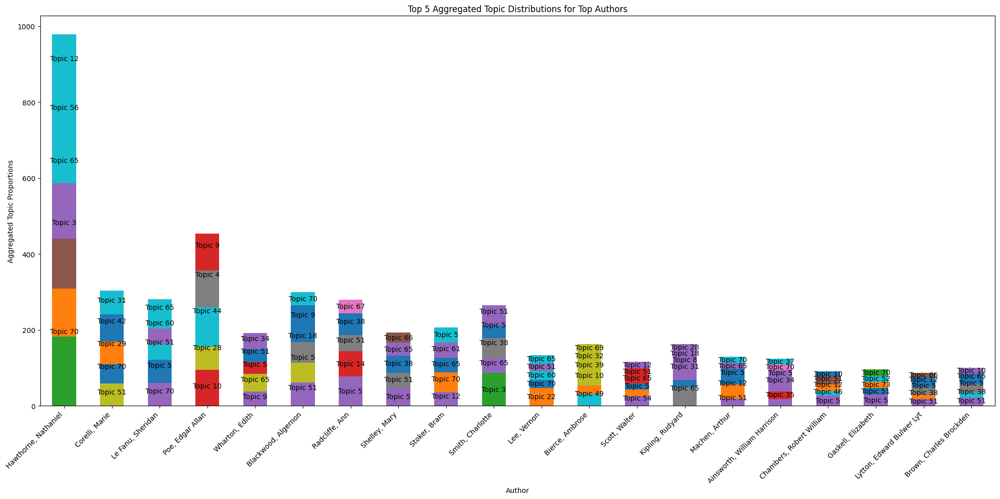

In [ ]:
# Creating stacked bar charts with labels for the top 5 topics for Top Authors

plt.figure(figsize=(20, 10))


ax_top = filtered_data_top_authors.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Top Authors
for i, author in enumerate(top_authors):
    cum_value = 0
    for topic in top_5_topics_top_authors.loc[author]:
        value = filtered_data_top_authors.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_top.text(i, cum_value + value/2, topic, ha='center', va='center')
            cum_value += value

# Adding labels and title for Top Authors
plt.title('Top 5 Aggregated Topic Distributions for Top Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')

# Display the plot for Top Authors
plt.tight_layout()
plt.show()


<Figure size 2000x1000 with 0 Axes>

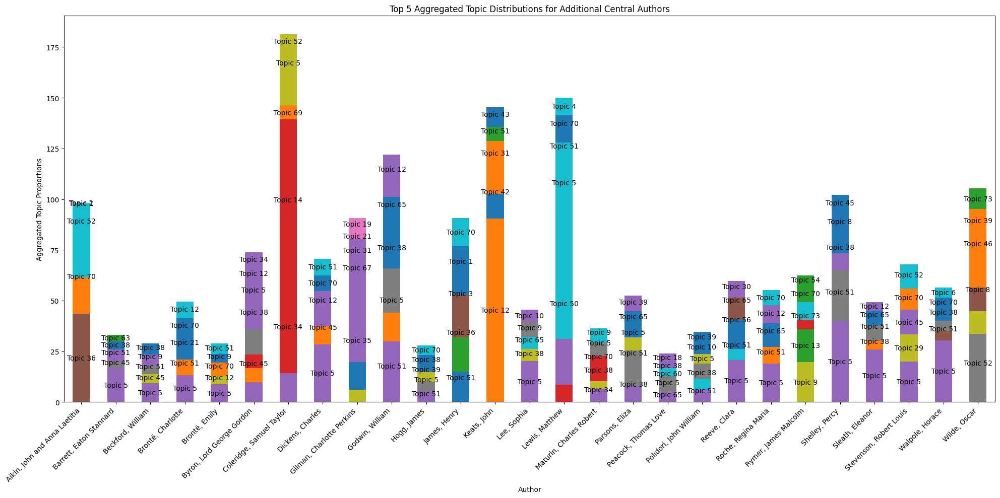

In [ ]:
plt.figure(figsize=(20, 10))

# Plotting the stacked bar chart for Central Authors
ax_refined_central = filtered_data_refined_central.plot(kind='bar', stacked=True, figsize=(20, 10), legend=False)

# Adding labels within each bar for Central Authors
for i, author in enumerate(refined_central_authors):
    cum_value = 0
    for topic in top_5_topics_refined_central.loc[author]:
        value = filtered_data_refined_central.at[author, topic]
        if value > 0:
            # Positioning the label in the center of the segment
            ax_refined_central.text(i, cum_value + value/2, topic, ha='center', va='center')
            cum_value += value

# Adding labels and title
plt.title('Top 5 Aggregated Topic Distributions for Additional Central Authors')
plt.xlabel('Author')
plt.ylabel('Aggregated Topic Proportions')
plt.xticks(rotation=45, ha='right')

# Display the plot for Central Authors
plt.tight_layout()
plt.show()

#### The most prevalent topics among these authors throughout time

In [ ]:
# Combining the topic distributions of both central and top authors
combined_topics = pd.concat([aggregated_topics_top_authors, aggregated_topics_refined_central])

# Determining the 10 most prevalent topics across the combined set
top_10_topics = combined_topics.sum().nlargest(10).index.tolist()

# Data Preparation for Time Series Analysis
# Aggregating occurrences of each of the 15 topics by year
time_series_data = df[df['author'].isin(top_authors + refined_central_authors)]

# Creating a DataFrame to store the yearly aggregated values for each topic
yearly_topic_aggregation = pd.DataFrame(index=time_series_data['date'].unique(), columns=top_10_topics)

# Aggregating the topics by year
for topic in top_10_topics:
    yearly_data = time_series_data.groupby('date')[topic].sum()
    yearly_topic_aggregation[topic] = yearly_data

# Sorting the index to ensure it's in chronological order
yearly_topic_aggregation.sort_index(inplace=True)

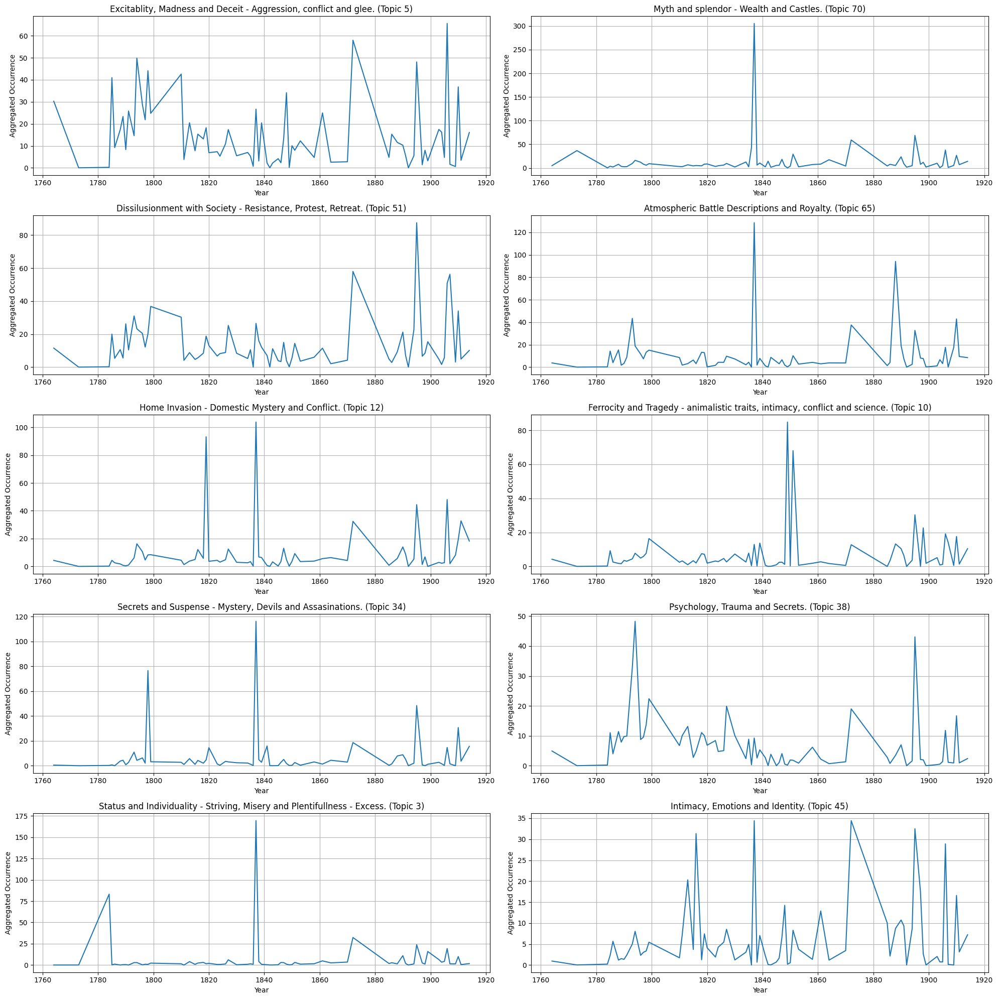

In [70]:
# Combining the topic distributions of both central and top authors
combined_topics = pd.concat([aggregated_topics_top_authors, aggregated_topics_refined_central])

# Determining the 10 most prevalent topics across the combined set
top_10_topics = combined_topics.sum().nlargest(10).index.tolist()

# Data Preparation for Time Series Analysis
# Aggregating occurrences of each of the 15 topics by year
time_series_data = df[df['author'].isin(top_authors + refined_central_authors)]

# Creating a DataFrame to store the yearly aggregated values for each topic
yearly_topic_aggregation = pd.DataFrame(index=time_series_data['date'].unique(), columns=top_10_topics)

# Aggregating the topics by year
for topic in top_10_topics:
    yearly_data = time_series_data.groupby('date')[topic].sum()
    yearly_topic_aggregation[topic] = yearly_data

# Sorting the index to ensure it's in chronological order
yearly_topic_aggregation.sort_index(inplace=True)

# Setting up the grid for facet wrap
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(5, 2)  # 5 rows, 2 columns

# Creating individual plots for each of the top 10 topics
for i, topic in enumerate(top_10_topics):
    ax = plt.subplot(gs[i])
    # Retrieve the label from topic_labels, or use the topic name if not found
    label = topic_labels.get(topic, topic)
    ax.plot(yearly_topic_aggregation.index, yearly_topic_aggregation[topic])
    ax.set_title(f"{label} ({topic})")  # Include the label and topic in the title
    ax.set_xlabel('Year')
    ax.set_ylabel('Aggregated Occurrence')
    ax.grid(True)

# Adjusting layout for readability
plt.tight_layout()

plt.show()


Contribution of authors as well as individual works to the most distinct topics and most important topics according to the previous results, as well as the results of the pyLDAvis results of multidimensional scaling

In [45]:
relevant_topics = [f"Topic {i}" for i in range(1, 21)] + ["Topic 70", "Topic 65", "Topic 51", "Topic 45", "Topic 38", "Topic 34"]
relevant_topics = [topic for topic in relevant_topics if topic in df.columns]

# Aggregate data: Calculate the sum of contributions for each author in each topic
author_topic_contribution = df.groupby('author')[relevant_topics].sum()

# For each topic, find the top 5 contributing authors
top_authors_per_topic = {topic: author_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

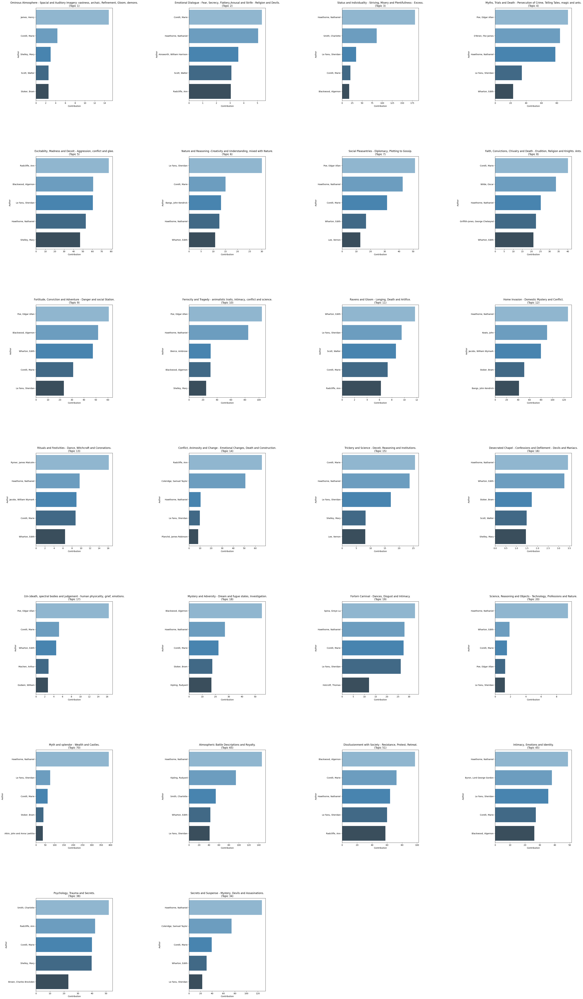

In [71]:
# Adjust the figure and subplots to accommodate all 26 topics (using a 7x4 grid)
fig, axes = plt.subplots(7, 4, figsize=(46, 85))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

for i, (topic, authors) in enumerate(top_authors_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=authors.values, y=authors.index, palette="Blues_d", hue=authors.index, legend=False)
        # Retrieve the label from topic_labels, or use the topic name if not found
        label = topic_labels.get(topic, topic)
        axes[i].set_title(f"{label}\n({topic})")  # Include the label and topic in the title
        axes[i].set_xlabel('Contribution')
        axes[i].set_ylabel('Author')

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Increase spacing between plots
fig.subplots_adjust(hspace=0.6, wspace=1.0)

plt.show()

#### The top texts per topic among the most prevalent topics

In [60]:
# Aggregate data: Calculate the sum of contributions for each text in each topic
title_topic_contribution = df.groupby('title')[relevant_topics].sum()

# For each topic, find the top 5 contributing texts
top_titles_per_topic = {topic: title_topic_contribution[topic].nlargest(5) for topic in relevant_topics}

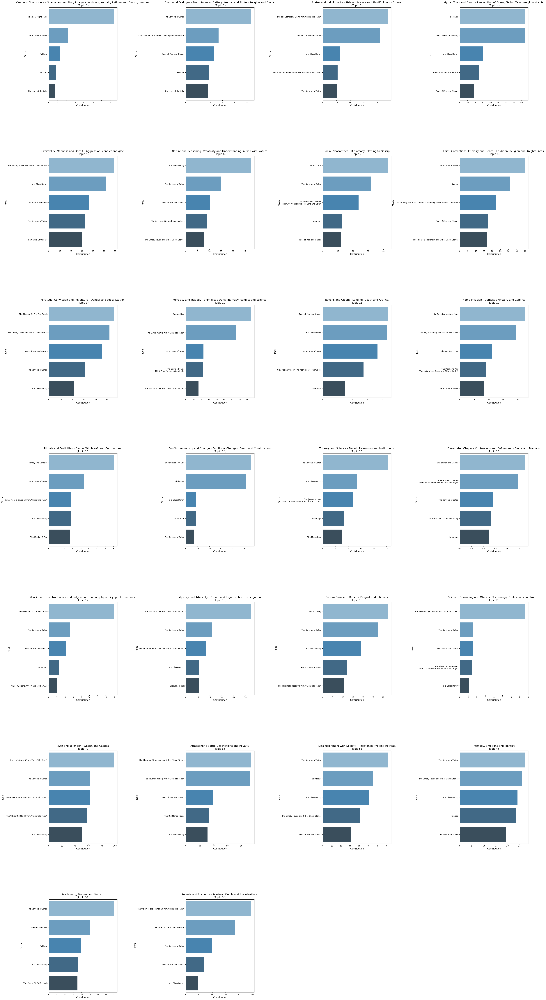

In [72]:
# Adjust the figure and subplots to accommodate all 26 topics (using a 7x4 grid)
fig, axes = plt.subplots(7, 4, figsize=(46, 95))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Setting font sizes for readability
title_fontsize = 14
label_fontsize = 12
tick_fontsize = 10

for i, (topic, titles) in enumerate(top_titles_per_topic.items()):
    # Check to ensure we don't go out of bounds
    if i < len(axes):
        sns.barplot(ax=axes[i], x=titles.values, y=titles.index, palette="Blues_d", hue=titles.index, legend=False)
        label = topic_labels.get(topic, topic)
        axes[i].set_title(f"{label}\n({topic})", fontsize=title_fontsize) 
        axes[i].set_xlabel('Contribution', fontsize=label_fontsize)
        axes[i].set_ylabel('Texts', fontsize=label_fontsize)
        axes[i].tick_params(labelsize=tick_fontsize)

# Hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

# Adjusting the layout with better spacing
plt.subplots_adjust(hspace=0.6, wspace=1.0)

plt.show()

#### Gender-Based Analysis

Negative scores for 'f' gender topics indicate that these topics have a lesser distinct association with the 'f' gender compared to their association with the 'm' gender. Positive scores for 'm' gender topics reflect a stronger distinct association with the 'm' gender. This approach focuses on enhancing the distinctiveness of each gender for specific topics, revealing topics where one gender's contribution is relatively more significant than the other's.

This distinctiveness score will be the ratio of the specific contribution of the gender to the total contribution, subtracted from the contribution of all others. A higher score indicates greater distinctiveness. It aims to represents the degree to which a topic is associated with one gender while minimizing the contribution of the other. 

#### Contribution among the leading topics:

In [73]:
# Calculate the total contribution for each topic
total_contributions = df[relevant_topics].sum()

# Calculate specific contributions for genders
specific_contributions = df.groupby('gender')[relevant_topics].sum()

# Calculate distinctiveness score: specific contribution divided by total contribution
distinctiveness_scores = specific_contributions.div(total_contributions)

# Subtracting the sum of contributions of other genders to enhance distinctiveness
for gender in distinctiveness_scores.index:
    other_genders = distinctiveness_scores.index.difference([gender])
    distinctiveness_scores.loc[gender] -= distinctiveness_scores.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender
top_distinct_topics = {gender: distinctiveness_scores.loc[gender].nlargest(5) for gender in distinctiveness_scores.index}

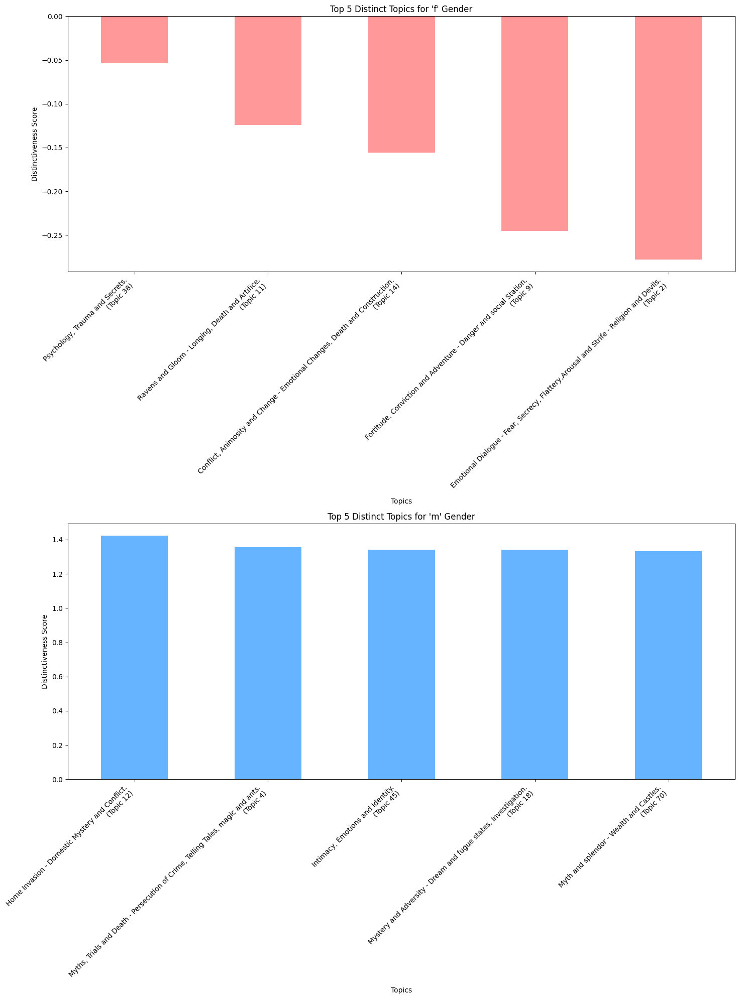

In [84]:
# Extracting the top 5 distinct topics for 'f' and 'm' genders
top_f_topics = top_distinct_topics['f']
top_m_topics = top_distinct_topics['m']

# Creating bar charts for each gender
fig, axes = plt.subplots(2, 1, figsize=(15, 20))

# Mapping topic names to labels for 'f' gender
f_topic_labels = [f"{topic_labels.get(topic, topic)}\n({topic})" for topic in top_f_topics.index]

# Top 5 distinct topics for 'f' gender
top_f_topics.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for 'f' Gender")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")
axes[0].set_xticklabels(f_topic_labels, rotation=45, ha='right')  # Set custom x-tick labels

# Mapping topic names to labels for 'm' gender
m_topic_labels = [f"{topic_labels.get(topic, topic)}\n({topic})" for topic in top_m_topics.index]

# Top 5 distinct topics for 'm' gender
top_m_topics.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for 'm' Gender")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")
axes[1].set_xticklabels(m_topic_labels, rotation=45, ha='right')  # Set custom x-tick labels

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


Notably, the scores are negative, indicating these topics are less distinctly associated with the 'f' gender compared to their association with the 'm' gender. The magnitude of the negative value represents the degree of this lesser association.

#### Contribution among all topics

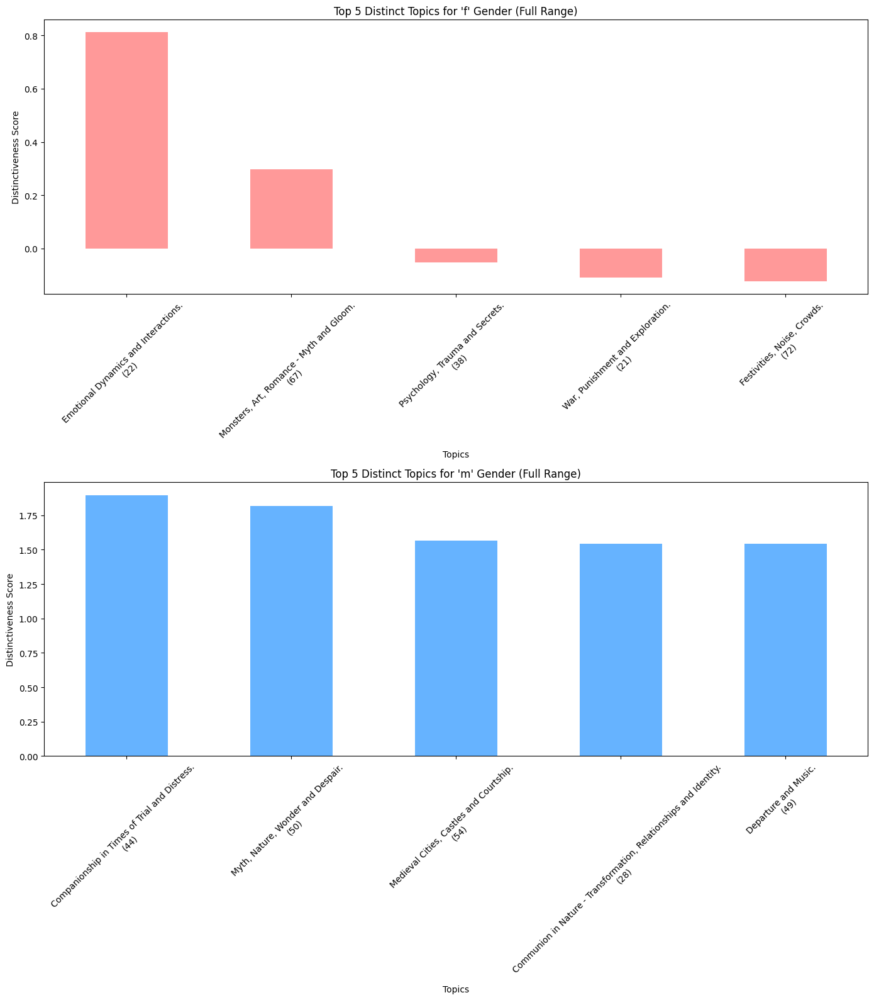

In [103]:
all_topics = [col for col in df.columns if col.startswith('Topic ')]

# Calculate the total contribution for each topic
total_contributions_all_topics = df[all_topics].sum()

# Calculate specific contributions for each gender for all topics
specific_contributions_all_topics = df.groupby('gender')[all_topics].sum()

# Calculate distinctiveness score for all topics
distinctiveness_scores_all_topics = specific_contributions_all_topics.div(total_contributions_all_topics)

# Subtracting the sum of contributions of other genders to enhance distinctiveness
for gender in distinctiveness_scores_all_topics.index:
    other_genders = distinctiveness_scores_all_topics.index.difference([gender])
    distinctiveness_scores_all_topics.loc[gender] -= distinctiveness_scores_all_topics.loc[other_genders].sum()

# Identifying top 5 distinct topics for each gender for all topics
top_distinct_topics_all_topics = {gender: distinctiveness_scores_all_topics.loc[gender].nlargest(5) for gender in distinctiveness_scores_all_topics.index}

# Extracting the top 5 distinct topics for 'f' and 'm' genders from the full topic range
top_f_topics_all = top_distinct_topics_all_topics['f']
top_m_topics_all = top_distinct_topics_all_topics['m']

# Creating bar charts for each gender with a potentially larger figure size
fig, axes = plt.subplots(2, 1, figsize=(14, 16))  # Adjusted figsize for a larger graph

# Generate the labels for 'f' gender with topic number on a new line
f_labels = [f"{topic_labels.get(topic, 'No Label')}\n({topic.split(' ')[-1]})" for topic in top_f_topics_all.index]

# Top 5 distinct topics for 'f' gender (full topic range)
top_f_topics_all.plot(kind='bar', ax=axes[0], color='#ff9999')
axes[0].set_title("Top 5 Distinct Topics for 'f' Gender (Full Range)")
axes[0].set_ylabel("Distinctiveness Score")
axes[0].set_xlabel("Topics")
axes[0].set_xticklabels(f_labels, rotation=45)  # Set custom x-tick labels with topic number

# Generate the labels for 'm' gender with topic number on a new line
m_labels = [f"{topic_labels.get(topic, 'No Label')}\n({topic.split(' ')[-1]})" for topic in top_m_topics_all.index]

# Top 5 distinct topics for 'm' gender (full topic range)
top_m_topics_all.plot(kind='bar', ax=axes[1], color='#66b3ff')
axes[1].set_title("Top 5 Distinct Topics for 'm' Gender (Full Range)")
axes[1].set_ylabel("Distinctiveness Score")
axes[1].set_xlabel("Topics")
axes[1].set_xticklabels(m_labels, rotation=45)  # Set custom x-tick labels with topic number

# Adjust layout and show the plots
plt.tight_layout()
plt.show()


In [ ]:
# Selecting the top distinct topics for each gender from the full topic range
top_f_topics_list = top_f_topics_all.index.tolist()
top_m_topics_list = top_m_topics_all.index.tolist()

# Function to find the texts with the highest contribution to a given topic
def find_representative_texts(topic, num_texts=3):
    return df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)

# Finding representative texts for each of the top topics
representative_texts_f = {topic: find_representative_texts(topic) for topic in top_f_topics_list}
representative_texts_m = {topic: find_representative_texts(topic) for topic in top_m_topics_list}

condensed_representative_texts = {
    "f_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_f.items()},
    "m_gender": {topic: texts[['title', 'author']].to_dict(orient='records') for topic, texts in representative_texts_m.items()}
}

condensed_representative_texts

{'f_gender': {'Topic 22': [{'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Hauntings', 'author': 'Lee, Vernon'},
   {'title': 'Arthur Mervyn; Or, Memoirs Of The Year 1793',
    'author': 'Brown, Charles Brockden'}],
  'Topic 67': [{'title': 'Superstition: An Ode', 'author': 'Radcliffe, Ann'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': "The Damned Thing\n1898, From 'In the Midst of Life'",
    'author': 'Bierce, Ambrose'}],
  'Topic 38': [{'title': 'The Banished Man', 'author': 'Smith, Charlotte'},
   {'title': 'The Castle Of Wolfenbach', 'author': 'Parsons, Eliza'},
   {'title': 'The Emigrants', 'author': 'Smith, Charlotte'}],
  'Topic 21': [{'title': 'Villette', 'author': 'Brontë, Charlotte'},
   {'title': 'The Yellow Wallpaper', 'author': 'Gilman, Charlotte Perkins'},
   {'title': 'The Grey Woman', 'author': 'Gaskell, Elizabeth'}],
  'Topic 72': [{'title': 'A Beleaguered City, Being A Narrative Of Certain Recent Events In 

#### Nationality-Based Analysis

Just as for gender, we will for each topic, calculate a distinctiveness score for each nationality, focusing on minimizing the contribution of other nationalities.

In [106]:
# Calculate the total contribution for each topic
total_contributions_nationality = df[all_topics].sum()

# Calculate specific contributions for each nationality for all topics
specific_contributions_nationality = df.groupby('nationality')[all_topics].sum()

# Calculate distinctiveness score for all topics for each nationality
distinctiveness_scores_nationality = specific_contributions_nationality.div(total_contributions_nationality)

# Subtracting the sum of contributions of all other nationalities to enhance distinctiveness
for nationality in distinctiveness_scores_nationality.index:
    other_nationalities = distinctiveness_scores_nationality.index.difference([nationality])
    distinctiveness_scores_nationality.loc[nationality] -= distinctiveness_scores_nationality.loc[other_nationalities].sum()

# Identifying top 5 distinct topics for each nationality for all topics
top_distinct_topics_nationality = {nationality: distinctiveness_scores_nationality.loc[nationality].nlargest(5) for nationality in distinctiveness_scores_nationality.index}


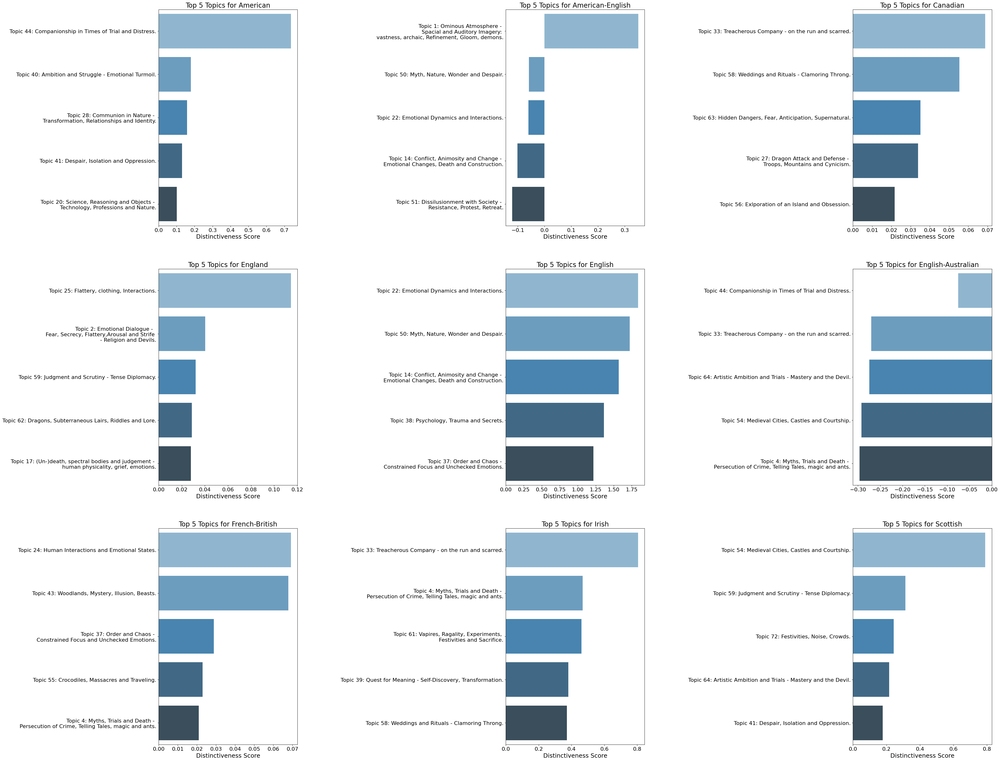

In [142]:

# Set global parameters for font sizes
plt.rcParams.update({'axes.titlesize': 20,   
                     'axes.labelsize': 18,   # X and Y labels font size
                     'xtick.labelsize': 16,  
                     'ytick.labelsize': 16, 
                     'legend.fontsize': 14}) 

selected_nationalities = list(top_distinct_topics_nationality.keys())[:9]

# Creating subplots in a 3x3 grid
fig, axes = plt.subplots(3, 3, figsize=(45, 40))

# Flattening the axes array for easier iteration
axes = axes.flatten()

# Plotting the distinctiveness scores for each selected nationality
for i, nationality in enumerate(selected_nationalities):
    topics_data = top_distinct_topics_nationality[nationality].head(5).reset_index()
    topics_data.columns = ['Topic', 'Distinctiveness Score']
    topics_data['Topic Number'] = topics_data['Topic'].str.extract(r'(\d+)')
    
    # Map the 'Topic Number' to the corresponding labels and include the topic number
    topics_data['Topic Label'] = topics_data['Topic Number'].apply(lambda x: f'Topic {x}: ' + topic_labels.get(f'Topic {x}', f'Topic {x}'))
    
    # Assign 'Topic Label' to hue and disable legend
    sns.barplot(x='Distinctiveness Score', y='Topic Label', data=topics_data, ax=axes[i], palette="Blues_d", hue='Topic Label', legend=False)
    axes[i].set_title(f'Top 5 Topics for {nationality}')
    axes[i].set_xlabel('Distinctiveness Score')
    axes[i].set_ylabel('')
    # Check if legend exists before trying to remove it
    legend = axes[i].get_legend()
    if legend:
        legend.remove()

# Adjusting layout to add space between the columns
fig.subplots_adjust(wspace=1.5)  # Adjust this value as needed to increase space

# Show the plots
plt.show()

In [ ]:
# Function to find the texts with the highest contribution to a given topic for each nationality
def find_representative_texts_nationality(topics, num_texts=3):
    representative_texts = {}
    for nationality, topics_scores in topics.items():
        representative_texts[nationality] = {}
        for topic in topics_scores.index:
            top_texts = df.sort_values(by=topic, ascending=False)[['title', 'author', topic]].head(num_texts)
            representative_texts[nationality][topic] = top_texts.to_dict(orient='records')
    return representative_texts

# Finding representative texts for each of the top topics of each nationality
representative_texts_nationality = find_representative_texts_nationality(top_distinct_topics_nationality)

representative_texts_nationality

{'American': {'Topic 44': [{'title': 'The Tell-Tale Heart',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 94.58},
   {'title': 'In Search of the Unknown',
    'author': 'Chambers, Robert William',
    'Topic 44': 1.64},
   {'title': 'The Narrative Of Arthur Gordon Pym Of Nantucket',
    'author': 'Poe, Edgar Allan',
    'Topic 44': 1.55}],
  'Topic 40': [{'title': "Fancy's Show-Box (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 50.5},
   {'title': 'The Italian, Or, The Confessional Of The Black Penitents. A Romance',
    'author': 'Radcliffe, Ann',
    'Topic 40': 5.33},
   {'title': "Snow Flakes (From 'Twice Told Tales')",
    'author': 'Hawthorne, Nathaniel',
    'Topic 40': 2.66}],
  'Topic 28': [{'title': 'The Oval Portrait',
    'author': 'Poe, Edgar Allan',
    'Topic 28': 96.28},
   {'title': 'The Phantom Rickshaw, and Other Ghost Stories',
    'author': 'Kipling, Rudyard',
    'Topic 28': 14.09},
   {'title': 'In Search of the Unknown',
  

#### Connection between sentiment and different topics:

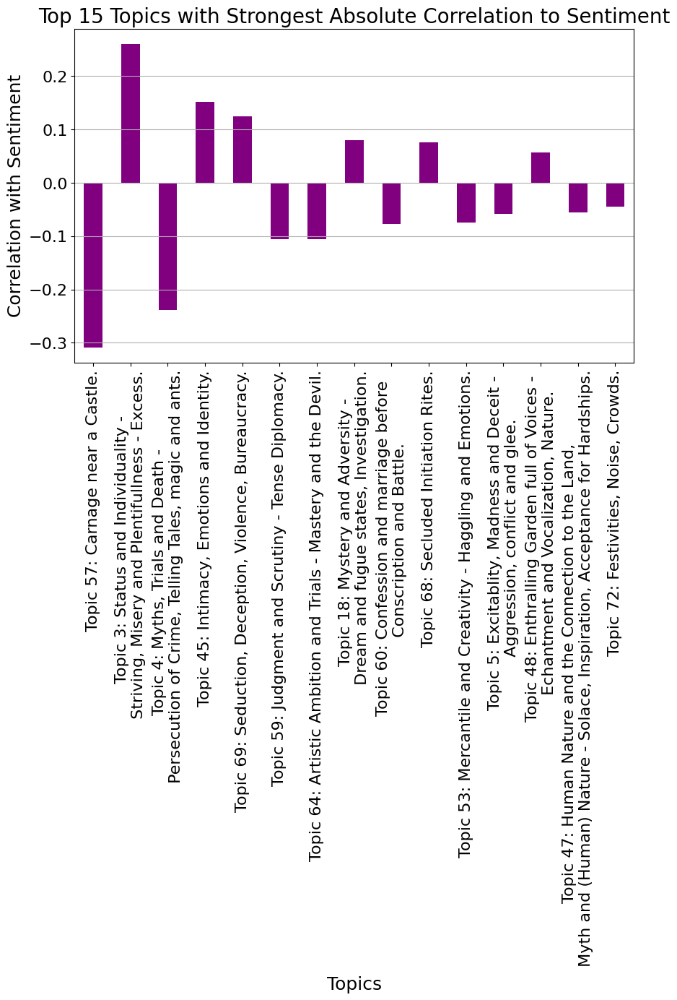

In [147]:
all_topics_sentiment_correlations = df[all_topics + ['sentiment']].corr()['sentiment'].drop('sentiment')

# Selecting the 15 topics with the strongest absolute correlation (considering both positive and negative)
strongest_absolute_correlations = all_topics_sentiment_correlations.abs().nlargest(15)
selected_strongest_absolute_topics = strongest_absolute_correlations.index.tolist()

# Creating a list of labels with topic numbers and labels for the selected topics using the mapping dictionary
selected_labels_with_numbers = [f'{topic}: {topic_labels.get(topic, "Label not found")}' for topic in selected_strongest_absolute_topics]

# Visualization of the correlation for these 15 topics
plt.figure(figsize=(10, 6))
all_topics_sentiment_correlations[selected_strongest_absolute_topics].plot(kind='bar', color='purple')

# Replace the X-axis tick labels with the selected labels
plt.xticks(range(len(selected_labels)), selected_labels_with_numbers, rotation=90)

plt.title('Top 15 Topics with Strongest Absolute Correlation to Sentiment')
plt.xlabel('Topics')
plt.ylabel('Correlation with Sentiment')
plt.grid(axis='y')

# Show the plot
plt.show()

The correlation with sentiment is not overly strong, but still given for some topics

#### Distribution of Topics among Periods, Text Sources and Roles 

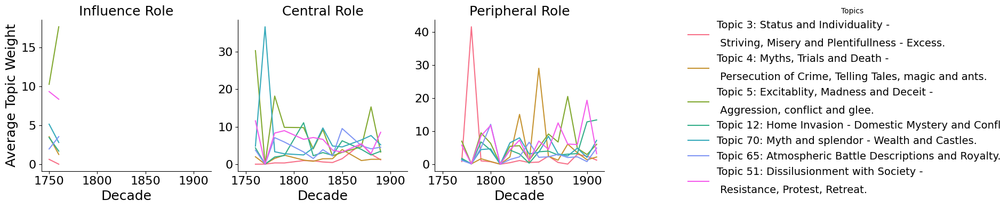

In [153]:
df_per = df_txt_features_LDA.copy()

df_per['date'] = pd.to_numeric(df_per['date'], errors='coerce')
df_per = df_per.dropna(subset=['date'])

# Extract the decade from the 'date' and create a new column for it
df_per['decade'] = (df_per['date'] // 10 * 10).astype(int)

# Define the relevant topics as specified
relevant_topics = [f"Topic {i}" for i in range(1, 21)] + ["Topic 70", "Topic 65", "Topic 51", "Topic 45", "Topic 38", "Topic 34"]


decade_grouped = df_per.groupby('decade')[topic_columns].mean()

# Identifying topics that have a peak value greater than 8
peaking_topics = [topic for topic in topic_columns if decade_grouped[topic].max() > 8]

agg_topics_by_decade_role = df_per.groupby(['decade', 'role'])[topic_columns].mean().reset_index()

# Filter the relevant topics list to include only those peaking topics
filtered_relevant_topics = [topic for topic in relevant_topics if topic in peaking_topics]

palette = sns.color_palette("husl", n_colors=len(filtered_relevant_topics))

# Creating a facet grid for the filtered topics, overlaying all topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_role, col="role", col_wrap=3, height=4, sharey=False, palette="viridis")

for i, topic in enumerate(filtered_relevant_topics):
    # Map the topic number to its label
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)


# Add a legend with the topic labels instead of the numbers
g.add_legend(title="Topics")

# Adjust the legend to display full topic labels if necessary
for text, topic in zip(g._legend.texts, filtered_relevant_topics):
    text.set_text(f'{topic}: {topic_labels.get(topic, "Label not found")}')

g._legend.set_bbox_to_anchor((1.05, 0.5))
plt.setp(g._legend.get_texts(), linespacing=2)

g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Role")

# Show the plot
plt.show()

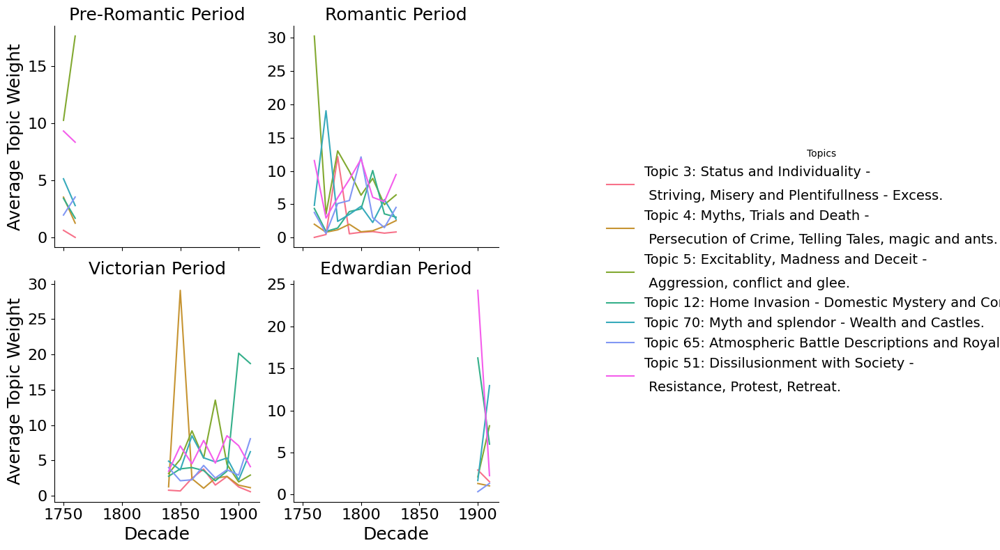

In [156]:
agg_topics_by_decade_period = df_per.groupby(['decade', 'period'])[topic_columns].mean().reset_index()

palette = sns.color_palette("husl", n_colors=len(filtered_relevant_topics))

# Creating a facet grid for each period, overlaying all filtered relevant topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_period, col="period", col_wrap=2, height=4, sharey=False, palette=palette)

# Map each topic to a line in the grid and include both the topic number and label in the legend
for i, topic in enumerate(filtered_relevant_topics):
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)

# Draw the plot and adjust the legend
g.add_legend(title="Topics")
g._legend.set_bbox_to_anchor((1.05, 0.5))
plt.setp(g._legend.get_texts(), linespacing=2)

# Adjusting plot labels
g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Period")

# Show the plot
plt.show()

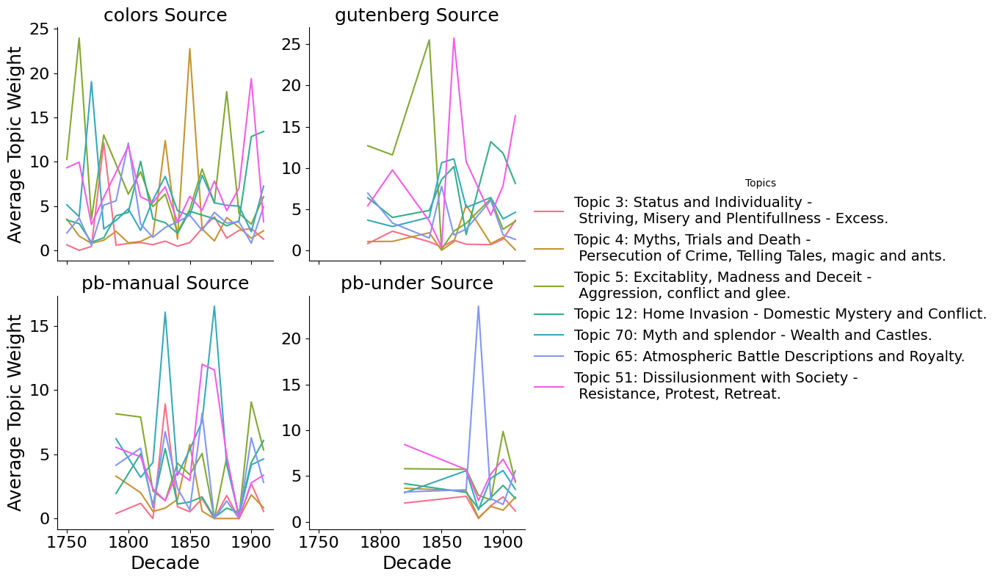

In [157]:
# Aggregating the topic distributions by decade and source
agg_topics_by_decade_source = df_per.groupby(['decade', 'source'])[topic_columns].mean().reset_index()

# Creating a facet grid for each source, overlaying all filtered relevant topics in each linechart
g = sns.FacetGrid(agg_topics_by_decade_source, col="source", col_wrap=2, height=4, sharey=False, palette=palette)
# Map each topic to a line in the grid and include both the topic number and label in the legend
for i, topic in enumerate(filtered_relevant_topics):
    topic_label = f'{topic}: {topic_labels.get(topic, "Label not found")}'
    g = g.map_dataframe(sns.lineplot, x="decade", y=topic, color=palette[i], label=topic_label)

# Adjusting plot labels and adding a legend for different topics
g.add_legend(title="Topics")
g.set_axis_labels("Decade", "Average Topic Weight")
g.set_titles(col_template="{col_name} Source")
plt.show()

### Cluster Analysis

We will have a look at the relationship between the texts with regards to their topic distributions as features. For this we will use Principal component analysis on the topic columns and and K-Means clustering on the results to group them into categories

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



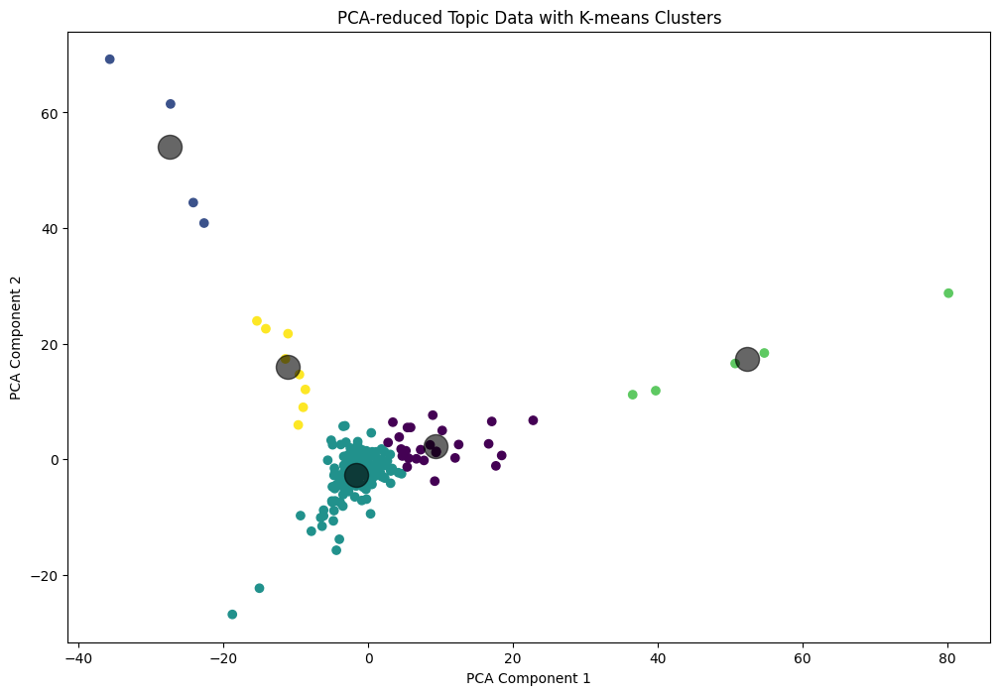

In [ ]:
df_clu = df_txt_features_LDA.copy()

# Selecting only the topic distribution columns for clustering
topic_data = df_clu[topic_columns]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=5)  # Choosing 5 clusters arbitrarily, can be tuned
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

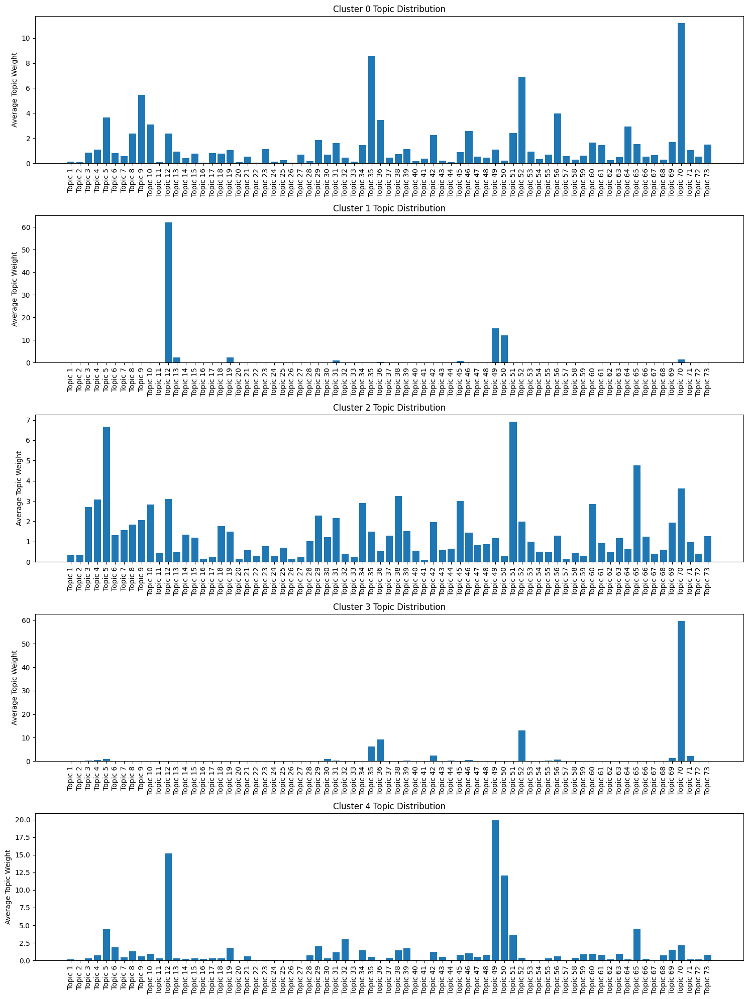

In [ ]:
# Plotting the topic distributions for each cluster
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(15, 20))

for i in range(5):  
    cluster_data = df_clu[df_clu['cluster'] == i][topic_columns].mean()
    axs[i].bar(x=cluster_data.index, height=cluster_data.values)
    axs[i].set_title(f'Cluster {i} Topic Distribution')
    axs[i].set_ylabel('Average Topic Weight')
    axs[i].tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.show()

Let us have a closer look at the outliers

In [ ]:
# Counting the number of texts in each cluster
cluster_counts = df_clu['cluster'].value_counts()

# Creating a dictionary with clusters as keys and references as values
cluster_references_dict = df_clu.groupby('cluster')['reference'].apply(list).to_dict()

# Filtering the dictionary to include only the three smallest clusters
# Sorting clusters by their size to identify the three smallest
smallest_clusters = cluster_counts.nsmallest(3).index
smallest_cluster_references = {cluster: cluster_references_dict[cluster] for cluster in smallest_clusters}

# Printing the references for the three smallest clusters
smallest_cluster_references


{1: ['Hawthorne_SundayatHo_1',
  'Jacobs_TheMonkeyS_1',
  'Jacobs_TheMonkeys_1',
  'Keats_LaBelleDam_1'],
 3: ['Aikin_SirBertran_1',
  'Hawthorne_LittleAnni_1',
  'Hawthorne_TheLilysQu_1',
  'Hawthorne_TheMiniste_1',
  'Hawthorne_TheWhiteOl_1'],
 4: ['Bangs_GhostsIHav_1',
  'Bierce_AnOccurren_1',
  'Holcroft_AnnaStIves_1',
  'Lewis_AlonzoTheB_1',
  'Machen_TheHouseof_1',
  'Stagg_TheVampyre_1',
  'Stoker_TheLairOfT_1',
  'unsigned_CountRoder_1']}

#### Hierarchical Clustering

Now we will have a look at the result of hierarchical clustering of topics based on their distribution similarity.

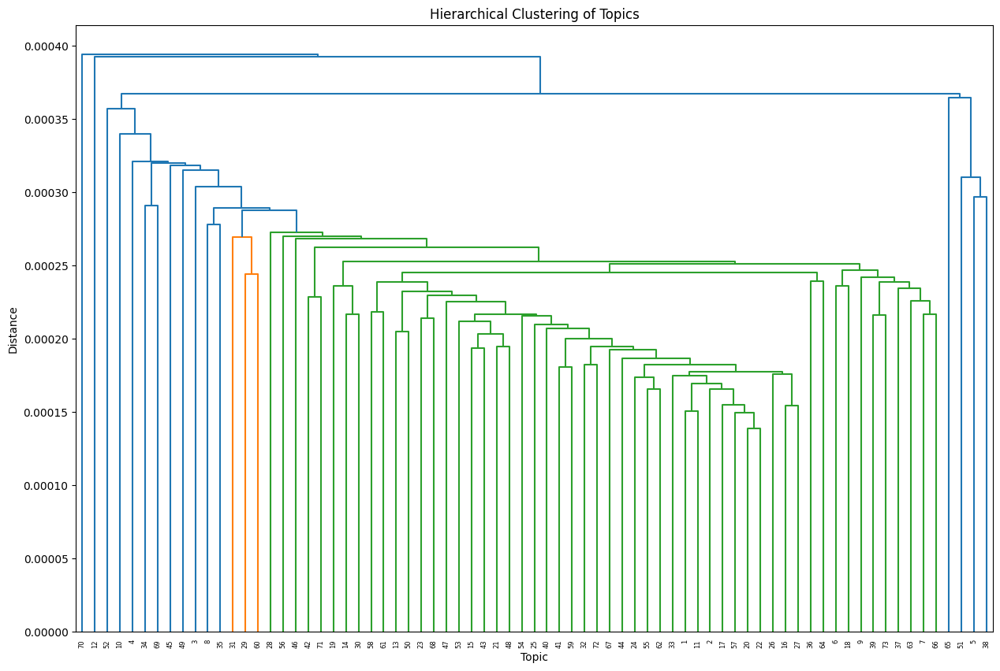

In [ ]:
# Cmpute Jensen-Shannon divergence, the metric also in use in pyLDAVis
def jensen_shannon_divergence(p, q):
    """
    Compute the Jensen-Shannon divergence between two probability distributions.
    """
    p = np.asarray(p)
    q = np.asarray(q)
    m = (p + q) / 2
    return (entropy(p, m) + entropy(q, m)) / 2

# Compute the distance matrix using Jensen-Shannon divergence
dist_matrix = pdist(topic_term_dists_LDA, metric=jensen_shannon_divergence)

# Perform hierarchical clustering
linkage_matrix = linkage(dist_matrix, method='average')

plt.figure(figsize=(15, 10))
dendrogram(linkage_matrix, labels=range(1, len(topic_term_dists_LDA) + 1))
plt.title('Hierarchical Clustering of Topics')
plt.xlabel('Topic')
plt.ylabel('Distance')
plt.show()


#### Correlation Heatmap

The following correlation matrix covers the attributes 'gender', 'nationality', 'source', 'sentiment', 'period', 'mode', 'genre','role', 'cluster' and a binary indication of high or low topic values for each topic 

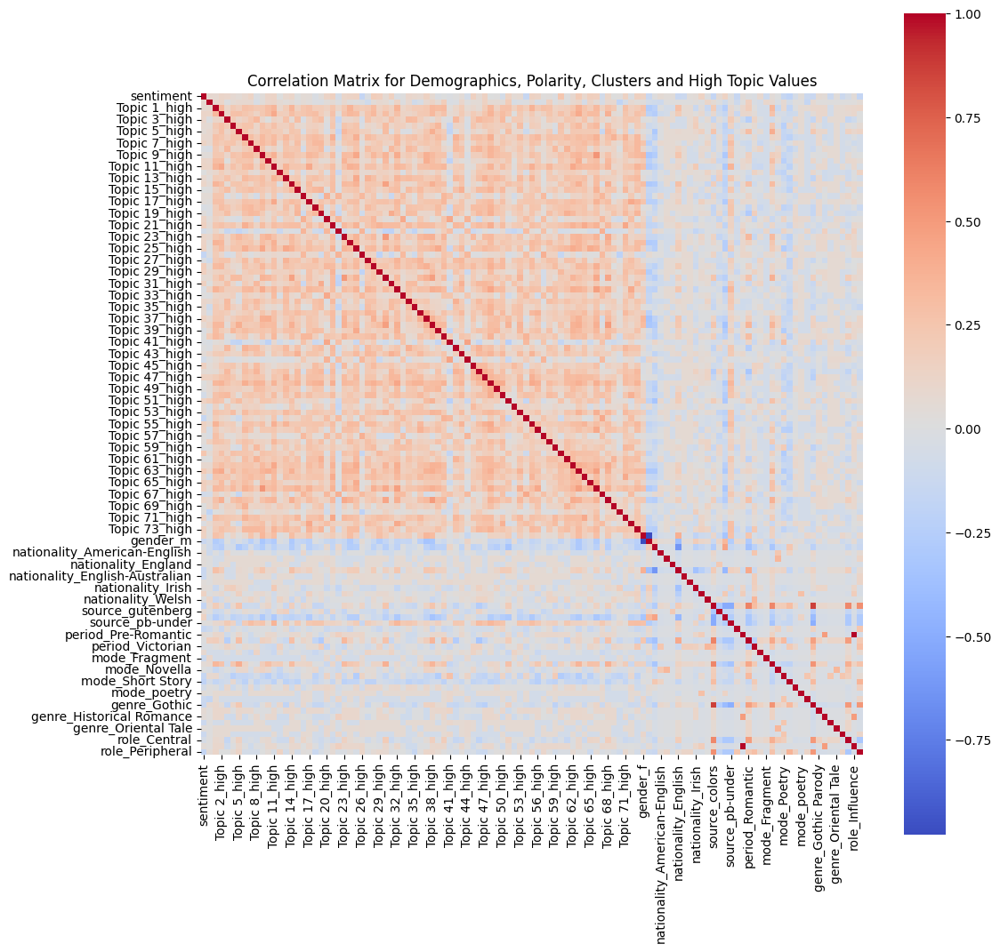

In [ ]:
# Calculating the median for each topic and creating binary variables for high/low values
topic_medians = df_clu[topic_columns].median()
for topic in topic_columns:
    df_clu[f'{topic}_high'] = df_clu[topic] > topic_medians[topic]

# Selecting the columns of interest for correlation analysis
columns_of_interest = ['gender','nationality', 'source', 'sentiment',
                       'period', 'mode', 'genre', 'role', 'cluster'] + [f'{topic}_high' for topic in topic_columns]

# Creating a new dataframe with these columns
analysis_df = df_clu[columns_of_interest]

# Converting categorical variables to dummy variables for correlation analysis
analysis_df_dummies = pd.get_dummies(analysis_df, columns=['gender', 'nationality', 'source', 'period', 'mode', 'genre', 'role'])

# Calculating the correlation matrix
correlation_matrix = analysis_df_dummies.corr()

# Visualizing the correlation matrix
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, cmap='coolwarm', square=True)
plt.title('Correlation Matrix for Demographics, Polarity, Clusters and High Topic Values')
plt.show()

#### Network Analysis:

The following network analysis deals with influence among texts, with the intentn of establishing influence and similarity among authors.
For this pairwise similarity between documents based on topic distributions using cosine similarity is used.

Nodes will represent the documents. Edges will represent the similarity between documents, potentially with a threshold to filter out low-similarity connections.

Network Analysis:Analyze the network to find clusters of similar texts, centrality measures, and other network characteristics.

In [159]:
df_net = df_txt_features_LDA.copy()
topic_columns = [col for col in df_net.columns if col.startswith('Topic ')]
# Set seed for Python's built-in random number generator
random.seed(3)
# Set seed for NumPy's random number generator
np.random.seed(3)

#### Network of overall similarity of texts

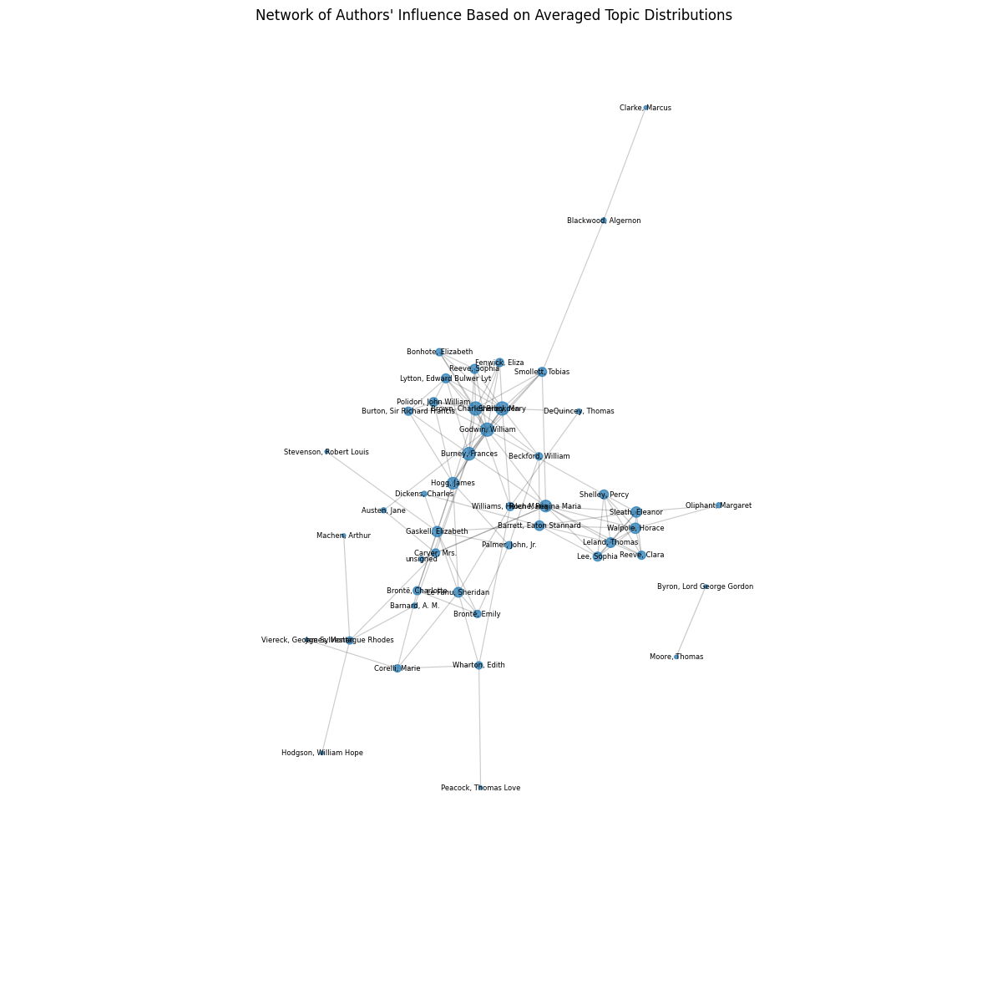

In [ ]:
# Group by 'author' and calculate the mean for each topic column
author_topics = df_net.groupby('author')[topic_columns].mean().reset_index()

# Recalculate the cosine similarities based on the averaged topic distributions
similarity_matrix = cosine_similarity(author_topics[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the diagonal with np.nan to avoid self-loops
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.85

# Initialize an undirected graph
G = nx.Graph()

# Add nodes to the graph, using authors as the node identifier
for idx, row in author_topics.iterrows():
    G.add_node(row['author'], author=row['author'])

# Add edges based on the similarity threshold and the averaged topic distribution
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i][j] >= similarity_threshold:
            author_i = author_topics.iloc[i]['author']
            author_j = author_topics.iloc[j]['author']
            G.add_edge(author_i, author_j, weight=similarity_matrix[i][j])

# Nodes
node_sizes = [10 * G.degree(n) for n in G.nodes()]

# Edges
edges = G.edges()
weights = [G[u][v]['weight'] for u,v in edges]

# Labels
labels = {author: author for author in author_topics['author']}

# Label only the most central nodes to reduce label overlap
degree_dict = dict(G.degree(G.nodes()))
central_nodes = [node for node in degree_dict if degree_dict[node] >= np.percentile(list(degree_dict.values()), 50)]  # Adjust threshold as needed
central_labels = {node: labels[node] for node in central_nodes}

# Use the Spring layout for a more spread out layout
pos = nx.spring_layout(G, k=0.15, iterations=20, seed=5) 

# Now we'll draw the graph with the new positions and labels
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.2)
nx.draw_networkx_labels(G, pos, labels=central_labels, font_size=6)

plt.title("Network of Authors' Influence Based on Averaged Topic Distributions")
plt.axis('off') 
plt.show()


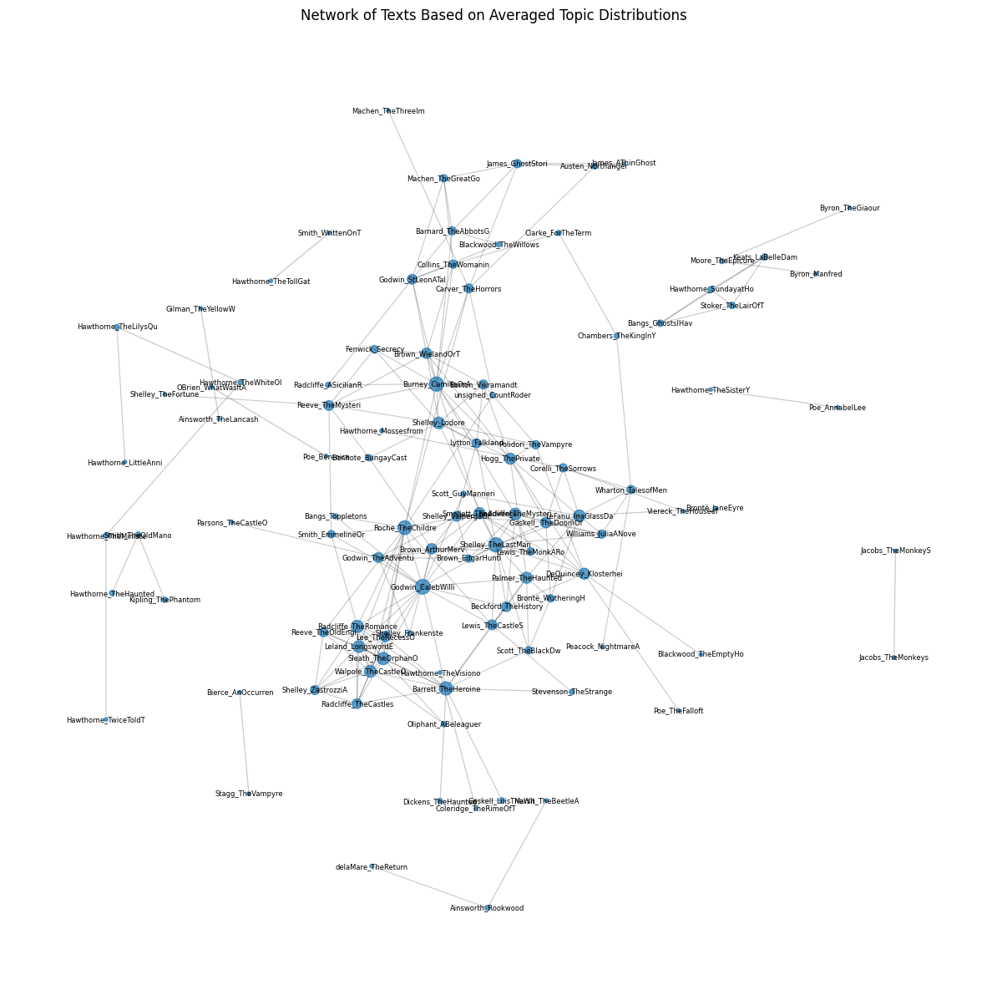

In [ ]:
# Group by 'text_key' and calculate the mean for each topic column
text_key_topics = df_net.groupby('text_key')[topic_columns].mean().reset_index()

# Recalculate the cosine similarities based on the averaged topic distributions
similarity_matrix = cosine_similarity(text_key_topics[topic_columns])

# Since the similarity matrix is symmetric, we'll fill the diagonal with np.nan to avoid self-loops
np.fill_diagonal(similarity_matrix, np.nan)

# Define a similarity threshold
similarity_threshold = 0.85

# Initialize an undirected graph
G = nx.Graph()

# Add nodes to the graph, using text_keys as the node identifier
for idx, row in text_key_topics.iterrows():
    G.add_node(idx, text_key=row['text_key'])

# Add edges based on the similarity threshold and the averaged topic distribution
for i in range(len(similarity_matrix)):
    for j in range(i+1, len(similarity_matrix)):
        if similarity_matrix[i][j] >= similarity_threshold:
            text_key_i = text_key_topics.iloc[i]['text_key']
            text_key_j = text_key_topics.iloc[j]['text_key']
            G.add_edge(text_key_i, text_key_j, weight=similarity_matrix[i][j])

# Nodes
node_sizes = [10 * G.degree(n) for n in G.nodes()]

# Edges
edges = G.edges()
weights = [G[u][v]['weight'] for u, v in edges]

# Labels - using the 'text_key' as labels
# Create labels for all nodes in the graph, using 'text_key' as labels
labels = {row['text_key']: row['text_key'] for idx, row in df_net.iterrows()}

# Now, create central_labels only for the most central nodes
degree_dict = dict(G.degree(G.nodes()))
central_nodes = [node for node in degree_dict if degree_dict[node] >= np.median(list(degree_dict.values()))]

# When creating central_labels, ensure that the node exists in labels
central_labels = {node: labels[node] for node in central_nodes if node in labels}


# Use the Spring layout for a more spread out layout
pos = nx.spring_layout(G, k=0.15, iterations=20, seed=5) 

# Now we'll draw the graph with the new positions and labels
plt.figure(figsize=(15, 15))
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.7)
nx.draw_networkx_edges(G, pos, edgelist=edges, width=weights, alpha=0.2)
nx.draw_networkx_labels(G, pos, labels=central_labels, font_size=6)

plt.title("Network of Texts Based on Averaged Topic Distributions")
plt.axis('off')
plt.show()


#### Tracing Influence across the network

For this similarity shall be evaluated betwen all sections of a text equally, only its most prominent topics will be compared with the rest of the network and similarity will only be evalueted unilateraly from the older to the newer texts.

In [160]:
unique_text_keys = df_net['text_key'].unique()

topic_columns = [col for col in df_net.columns if col.startswith('Topic')]

# Create a new DataFrame to store the top 10 topics for each text segment
top_topics_list = []

# Iterate over each row in the DataFrame
for index, row in df_net.iterrows():
     # Sort the topics for this row and select the top 10
    sorted_topics = row[topic_columns].sort_values(ascending=False).head(10)
    
    # Create a dictionary of the top 10 topics
    top_topics_dict = sorted_topics.to_dict()

    # Add the dictionary to the list
    top_topics_list.append(top_topics_dict)

# Convert the list of dictionaries to a DataFrame
top_topics_df = pd.DataFrame(top_topics_list)
top_topics_df = top_topics_df.fillna(0)

In [161]:
# Function to calculate cosine similarity
def calculate_similarity(df):
    # Convert DataFrame to numpy array for similarity calculation
    matrix = df.to_numpy()

    sim_matrix = cosine_similarity(matrix)

    return sim_matrix

# Nullify all columns except the top ten topics for similarity calculation
similarity_matrix = calculate_similarity(top_topics_df)

# Initialize a directed graph
G = nx.DiGraph()

# Add nodes with text_key as label and date as attribute
for text_key in unique_text_keys:
    # Extract the date for this text_key
    date = df_net[df_net['text_key'] == text_key]['date'].iloc[0]
    G.add_node(text_key, date=date)

In [164]:
#Adding Edges
similarity_threshold = 0.75

# Creating a dictionary for quick access to text_key indices
text_key_to_index = {text_key: i for i, text_key in enumerate(unique_text_keys)}

# Iterate over each pair of text segments
for i, text_key1 in enumerate(unique_text_keys):
    for j, text_key2 in enumerate(unique_text_keys):
        if i != j:
            # Check if similarity is above the threshold
            if similarity_matrix[i, j] >= similarity_threshold:
                # Determine the direction of the edge based on the date
                date1 = df_net[df_net['text_key'] == text_key1]['date'].iloc[0]
                date2 = df_net[df_net['text_key'] == text_key2]['date'].iloc[0]

                if date1 < date2:
                    # Add edge from older text to newer text
                    G.add_edge(text_key1, text_key2, weight=similarity_matrix[i, j])
                elif date1 == date2:
                    # Add bilateral edges for texts from the same year
                    G.add_edge(text_key1, text_key2, weight=similarity_matrix[i, j])
                    G.add_edge(text_key2, text_key1, weight=similarity_matrix[j, i])

# Sort nodes by degree centrality (highest centrality first)
sorted_nodes = sorted(G.nodes(), key=lambda node: degree_centrality[node], reverse=True)

# Create a mapping of numbers to sorted node references
node_labels = {node: i for i, node in enumerate(sorted_nodes)}
# Create a reverse mapping for the legend
label_to_node = {i: node for node, i in node_labels.items()}

# Adjust node sizes based on degree
node_sizes = [G.degree(node) * 100 for node in sorted_nodes]

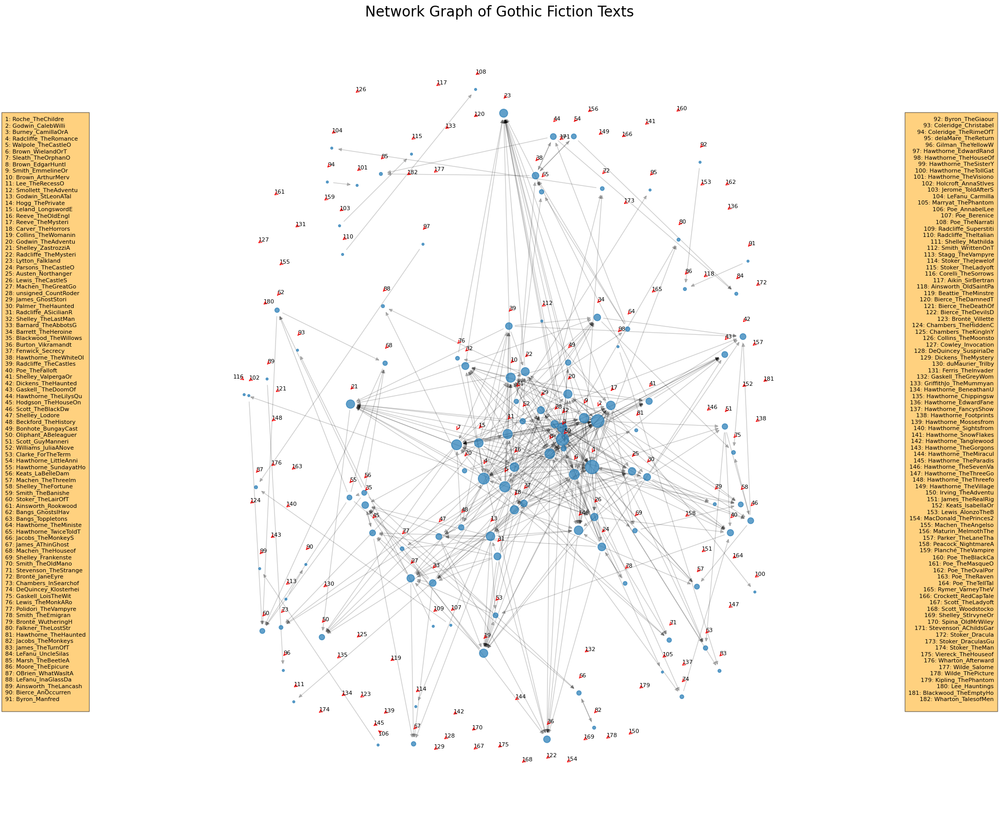

In [168]:
# Calculate the cumulative weight for edges where multiple connections exist
for u, v, data in G.edges(data=True):
    # Since it's a directed graph, we need to check both directions
    if G.has_edge(v, u):
        total_weight = data['weight'] + G[v][u]['weight']
        G[u][v]['weight'] = total_weight
        G[v][u]['weight'] = total_weight

# Calculate centrality measures
degree_centrality = nx.in_degree_centrality(G) 

# Storing these measures as node attributes for later use
for node, centrality in degree_centrality.items():
    G.nodes[node]['degree_centrality'] = centrality

# Detect communities using the Louvain method
partition = community_louvain.best_partition(G.to_undirected())

# Add community info to node attributes
for node, comm_id in partition.items():
    G.nodes[node]['community'] = comm_id
    

# Use colors for different communities
community_colors = [partition[node] for node in G.nodes()]

# Adjust node sizes to reflect centrality measures
node_sizes = [v * 1000 for v in degree_centrality.values()]  # The scale factor can be adjusted


# Calculate centrality (e.g., degree centrality)
centrality = nx.degree_centrality(G)

# Sort nodes by centrality (more central nodes get lower numbers)
sorted_nodes = sorted(G.nodes, key=lambda node: centrality[node], reverse=True)

# Assign numbers to nodes based on sorted order
numbered_labels = {node: i+1 for i, node in enumerate(sorted_nodes)}

# Use the spring layout for visualization
pos = nx.spring_layout(G, k=0.25, iterations=20, seed=42)

# Draw the graph
plt.figure(figsize=(20, 20))
nx.draw_networkx_edges(G, pos, alpha=0.2)
nx.draw_networkx_nodes(G, pos, node_size=[10 * G.degree(n) for n in G.nodes()], alpha=0.7)
# No need to draw labels here as we're adjusting their placement

# Adjust label positions to avoid overlap with nodes
labels_pos = {node: (pos[node][0], pos[node][1] + 0.04) for node in G.nodes()}  # Shift labels slightly above nodes

# Draw labels and use adjust_text to improve their placement
texts = []
for node, label_pos in labels_pos.items():
    text = plt.text(label_pos[0], label_pos[1], str(numbered_labels[node]), ha='center', va='center', fontsize=8)
    texts.append(text)
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

# Create a two-column legend
# Sort the legend items based on the numbers (keys)
sorted_legend_items = sorted(numbered_labels.items(), key=lambda item: item[1])
# Define the number of items per column
items_per_column = len(sorted_legend_items) // 2

# Initialize empty strings for each column of the legend
left_column_text = ""
right_column_text = ""

# Populate the column strings
for index, (node, number) in enumerate(sorted_legend_items):
    entry = f"{number}: {node}\n"
    if index < items_per_column:
        left_column_text += entry
    else:
        right_column_text += entry

# Adjust the figure size and layout to accommodate the legends on both sides
plt.subplots_adjust(left=0.2, right=0.8)

# Place the column strings on the plot
# Adjust these coordinates to place the legends on the far left and far right
plt.figtext(0.02, 0.5, left_column_text, ha="left", fontsize=8, bbox={"facecolor":"orange", "alpha":0.5, "pad":5}, va='center')
plt.figtext(0.98, 0.5, right_column_text, ha="right", fontsize=8, bbox={"facecolor":"orange", "alpha":0.5, "pad":5}, va='center')

plt.title('Network Graph of Gothic Fiction Texts')
plt.axis('off')
plt.show()

In [ ]:
# Calculate centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# Find the top 10 nodes for each centrality measure
top_10_degree = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:10]
top_10_betweenness = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:10]
top_10_closeness = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:10]
top_10_eigenvector = sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:10]

# Return the top 10 nodes for each metric
top_10_metrics = {
    "Degree Centrality": top_10_degree,
    "Betweenness Centrality": top_10_betweenness,
    "Closeness Centrality": top_10_closeness,
    "Eigenvector Centrality": top_10_eigenvector
}

top_10_metrics

{'Degree Centrality': ['Roche_TheChildre',
  'Godwin_CalebWilli',
  'Burney_CamillaOrA',
  'Radcliffe_TheRomance',
  'Walpole_TheCastleO',
  'Sleath_TheOrphanO',
  'Brown_WielandOrT',
  'Lee_TheRecessO',
  'Smith_EmmelineOr',
  'Smollett_TheAdventu'],
 'Betweenness Centrality': ['Roche_TheChildre',
  'Burney_CamillaOrA',
  'Godwin_CalebWilli',
  'Godwin_TheAdventu',
  'Hogg_ThePrivate',
  'Radcliffe_TheRomance',
  'Sleath_TheOrphanO',
  'Collins_TheWomanin',
  'Parsons_TheCastleO',
  'Radcliffe_TheMysteri'],
 'Closeness Centrality': ['Lytton_Falkland',
  'James_GhostStori',
  'Machen_TheGreatGo',
  'Blackwood_TheWillows',
  'Hogg_ThePrivate',
  'Collins_TheWomanin',
  'Brown_ArthurMerv',
  'James_AThinGhost',
  'Sleath_TheOrphanO',
  'Hodgson_TheHouseOn'],
 'Eigenvector Centrality': ['Hawthorne_TheWhiteOl',
  'Hawthorne_LittleAnni',
  'Hawthorne_TheLilysQu',
  'Marsh_TheBeetleA',
  'LeFanu_UncleSilas',
  'Hawthorne_TwiceToldT',
  'Blackwood_TheWillows',
  'James_AThinGhost',
  'Hodgson

check out the papers:
distributed character, the location of literary history, close and distant reading modernism and visualization in stylometry

# Appendix

In order to compare some base structures and evaluate the constency of topic distributions accross diferent varaints of topic modelling, a few select methods from above have also been applied to the CTM andETM model

#### CTM

In [ ]:
prepared_data = pyLDAvis.prepare(topic_term_dists_CTM, doc_topic_dists_CTM, doc_lengths, vocab, term_frequency)

# Display the visualization
pyLDAvis.display(prepared_data)

In [ ]:
df_CTM= df_txt_features_CTM.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_CTM['decade'] = df_CTM['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_CTM= [col for col in df_CTM.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_CTM= df_CTM.groupby('decade')[topic_columns_CTM].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_CTM.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_CTM.index, y=decade_grouped_CTM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_CTM.index, y=decade_grouped_CTM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



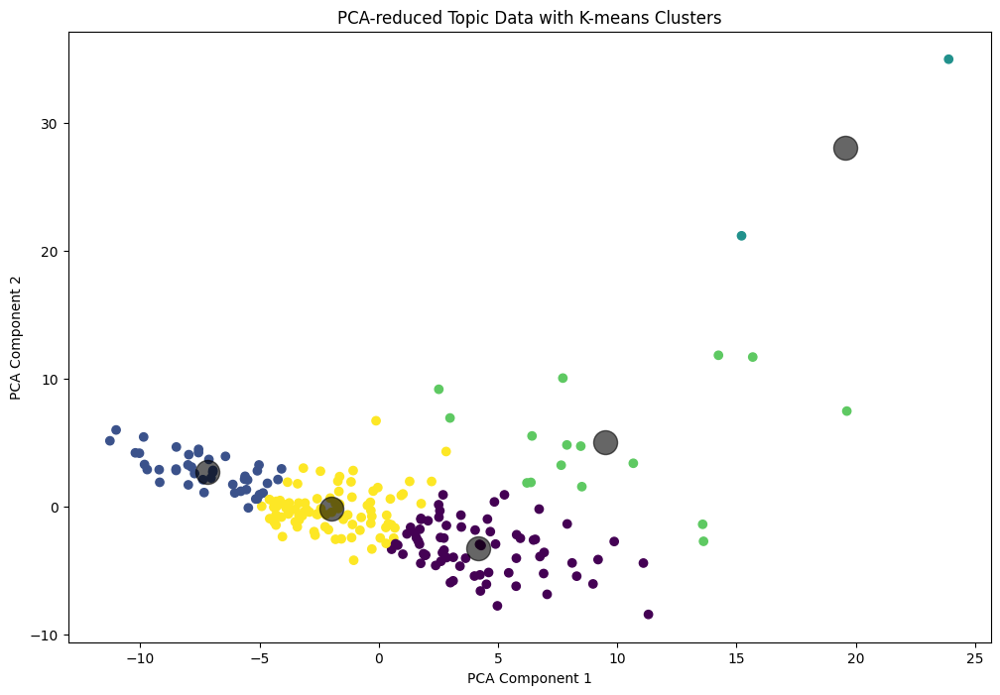

In [ ]:
df_CTM_clu = df_txt_features_CTM.copy()

# Selecting only the topic distribution columns for clustering
topic_columns_CTM= [col for col in df_CTM_clu.columns if col.startswith('Topic')]
topic_data = df_CTM_clu[topic_columns_CTM]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=5)  # Choosing 5 clusters arbitrarily, can be tuned
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_CTM_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

#### ETM

In [ ]:
prepared_data = pyLDAvis.prepare(topic_term_dists_ETM, doc_topic_dists_ETM, doc_lengths, vocab, term_frequency)

# Display the visualization
pyLDAvis.display(prepared_data)

In [ ]:
# Function to convert year to decade
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_time['decade'] = df_time['date'].apply(year_to_decade)

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped = df_time.groupby('decade')[topic_columns].mean()

plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in topic_columns:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [ ]:
plt.figure(figsize=(20, 8))  # Keeping the graph broad
for topic in fluctuating_topics:
    plt.plot(decade_grouped.index, decade_grouped[topic], label=topic)

plt.xlabel('Decade')
plt.ylabel('Topic Distribution')
plt.title('Adjusted Topic Trends Over Decades')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=10)  # Spreading out the legend further with fewer rows
plt.show()

In [ ]:
df_ETM = df_txt_features_ETM.copy()

app = dash.Dash(__name__)

# Function to convert year to decade for grouping
def year_to_decade(year):
    return (year // 10) * 10

# Applying the function to create a 'decade' column
df_ETM['decade'] = df_ETM['date'].apply(year_to_decade)

# Extracting topic columns
topic_columns_ETM= [col for col in df_ETM.columns if col.startswith('Topic')]

# Grouping by 'decade' and calculating the mean for topic distributions
decade_grouped_ETM= df_ETM.groupby('decade')[topic_columns_ETM].mean()

# Calculating the standard deviation for each topic to measure fluctuations
topic_fluctuations = decade_grouped_ETM.std()

# Function to filter topics based on a fluctuation percentile threshold
def filter_topics_by_percentile(threshold_percentile):
    percentile_threshold = np.percentile(topic_fluctuations, threshold_percentile)
    return topic_fluctuations[topic_fluctuations > percentile_threshold].index.tolist()

# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig


# Function to update the figure based on selected topics
def create_figure(selected_topics):
    fig = go.Figure()
    for topic in selected_topics:
        fig.add_trace(go.Scatter(x=decade_grouped_ETM.index, y=decade_grouped_ETM[topic],
                                 mode='lines', name=topic))
    fig.update_layout(legend_orientation="h", legend=dict(x=0, y=1.1, xanchor='left'))
    return fig

# Create slider
slider = dcc.Slider(
    id='percentile-slider',
    min=0,
    max=100,
    value=90,
    marks={i: f'{i}%' for i in range(0, 101, 25)},
    step=1
)

# Create dropdown (initially empty)
dropdown = dcc.Dropdown(
    id='topic-dropdown',
    options=[],
    value=[],
    multi=True
)

# App layout
app.layout = html.Div([
    html.Div([slider]),
    html.Div([dropdown]),
    dcc.Graph(id='topic-graph')
])


# Callback for updating the dropdown options and selected values based on slider value
@app.callback(
    [Output('topic-dropdown', 'options'),
     Output('topic-dropdown', 'value')],
    [Input('percentile-slider', 'value')]
)
def update_dropdown_options(percentile_value):
    filtered_topics = filter_topics_by_percentile(percentile_value)
    options = [{'label': topic, 'value': topic} for topic in filtered_topics]
    return options, [option['value'] for option in options]

# Callback for updating the graph based on selected topics and percentile
@app.callback(
    Output('topic-graph', 'figure'),
    [Input('topic-dropdown', 'value'),
     Input('percentile-slider', 'value')]
)
def update_graph(selected_topics, percentile_value):
    return create_figure(selected_topics)

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:753: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:591: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/Storage/Studium/DigitalHumanities/Semester5/Thesis/code_notebooks/.venv/lib/python3.9/site-packages/sklearn/utils/validation.py:600: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



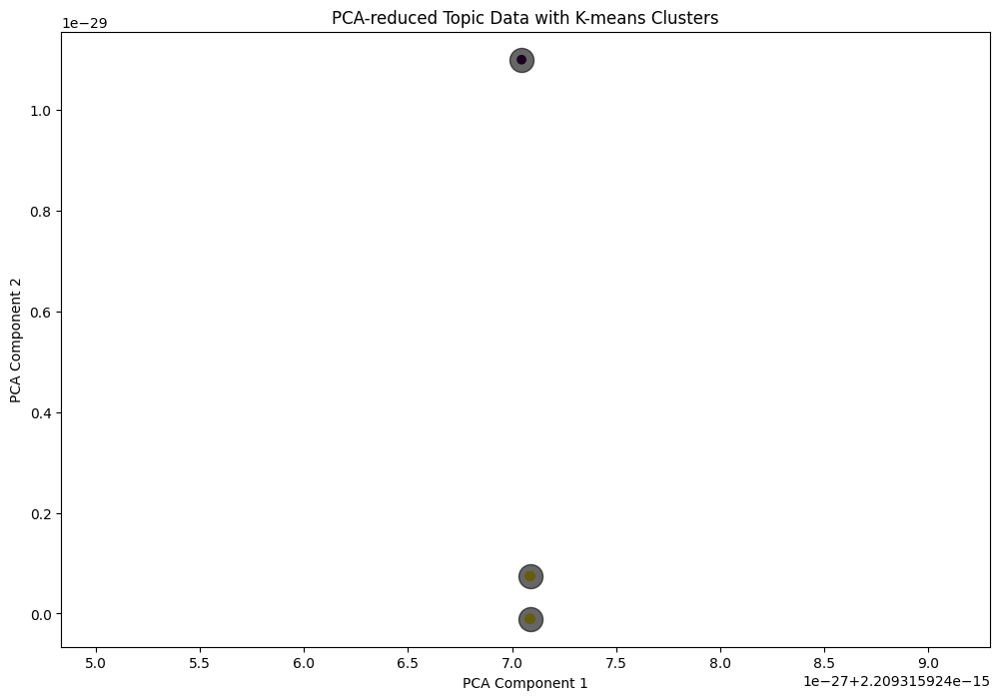

In [ ]:
df_ETM_clu = df_txt_features_ETM.copy()

# Selecting only the topic distribution columns for clustering
topic_columns_ETM= [col for col in df_ETM_clu.columns if col.startswith('Topic')]
topic_data = df_ETM_clu[topic_columns_ETM]

# Using PCA for dimensionality reduction
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(topic_data)

# Applying K-means clustering
kmeans = KMeans(n_clusters=3)  # Choosing 5 clusters arbitrarily, can be tuned
kmeans.fit(reduced_data)
labels = kmeans.predict(reduced_data)

df_ETM_clu['cluster'] = labels

# Plotting the results
plt.figure(figsize=(12, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', marker='o')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=300, alpha=0.6)
plt.title('PCA-reduced Topic Data with K-means Clusters')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()